In [46]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 

In [47]:
train_output = pd.read_csv("train_output_DzPxaPY.csv")
train_output.head()

,ID,FREQ,CM,ANNEE_ASSURANCE,CHARGE
0,1,0.0,0.0,1.000000,0.0
1,2,0.0,0.0,1.000000,0.0
2,3,0.0,0.0,0.402740,0.0
3,4,0.0,0.0,0.246575,0.0
4,5,0.0,0.0,0.838356,0.0


In [48]:
# prendre le produit round(2) pour calculé la charge

### Nettoyage de y

In [49]:
train_output = abs(train_output)
train_output.describe()
# grznde range de valeur pour Frq et CM

,ID,FREQ,CM,ANNEE_ASSURANCE,CHARGE
count,383610.000000,383610.000000,383610.000000,383610.000000,383610.000000
mean,191805.500000,0.012452,182.593925,0.701557,186.159351
std,110738.812719,0.357127,6699.965459,0.352375,6800.488350
min,1.000000,0.000000,0.000000,0.002732,0.000000
25%,95903.250000,0.000000,0.000000,0.389041,0.000000
50%,191805.500000,0.000000,0.000000,0.882192,0.000000
75%,287707.750000,0.000000,0.000000,1.000000,0.000000
max,383610.000000,182.499998,500000.000000,2.000000,552000.000000


In [51]:
# quand CM = 0 mais FREQ > 0 on met FREQ = 0
train_output.loc[(train_output["CM"] == 0) & (train_output["FREQ"] > 0),"FREQ"] = 0 

In [52]:
#sans round
print(((train_output["FREQ"]*train_output["ANNEE_ASSURANCE"]*train_output["ANNEE_ASSURANCE"]) == train_output["CHARGE"]).value_counts())
# avec round sur produit
print(((train_output["FREQ"]*train_output["CM"]*train_output["ANNEE_ASSURANCE"]).round(2) == train_output["CHARGE"]).value_counts())
# round sur tout elements du produit
print(((train_output["FREQ"].round(2)*train_output["CM"].round(2)*train_output["ANNEE_ASSURANCE"].round(2)) == train_output["CHARGE"]).value_counts())

# si il est ncr de recalculé la charge après modif de Cm ou freq, mettre le rst au round(2)

True     381253
False      2357
Name: count, dtype: int64
True    383610
Name: count, dtype: int64
True     382445
False      1165
Name: count, dtype: int64


In [53]:
# transformation box-cox sur CM et FREQ
from scipy.stats import boxcox
from scipy.special import inv_boxcox

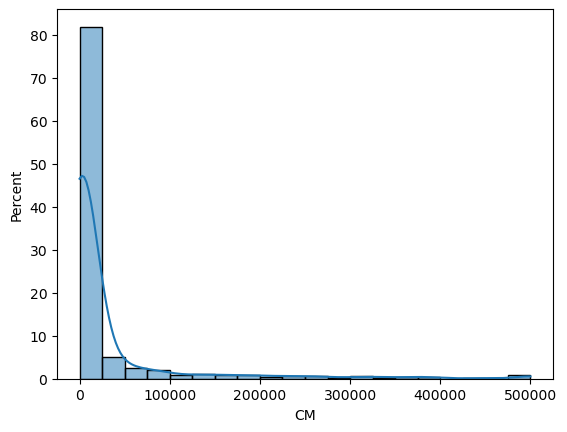

In [54]:
sns.histplot(train_output["CM"][train_output["CM"]>0],kde=True,bins=20,stat='percent');

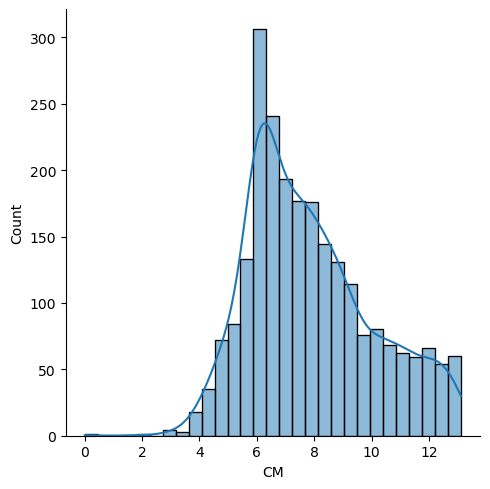

In [55]:
# log de CM exclu 0
sns.displot(np.log(train_output["CM"][train_output["CM"]>0]),kde=True);

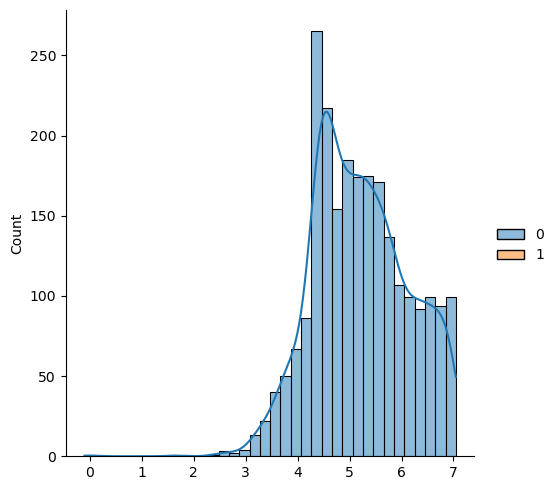

In [56]:
# log de CM exclu 0
sns.displot(boxcox(train_output["CM"][train_output["CM"]>0]),kde=True);

<Axes: xlabel='CM', ylabel='Percent'>

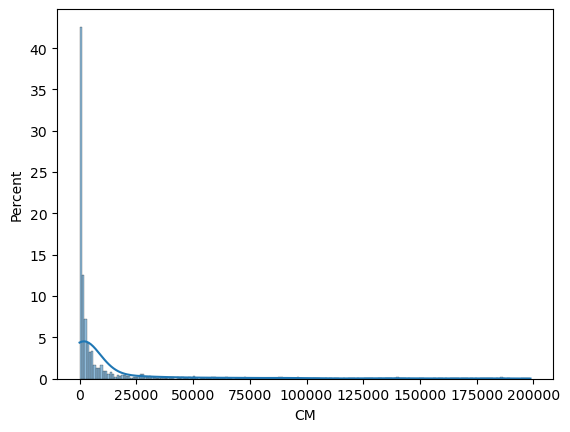

In [57]:
sns.histplot(train_output["CM"][(train_output["CM"] > 0) & (train_output["CM"] < 200000)],kde= True,stat="percent")


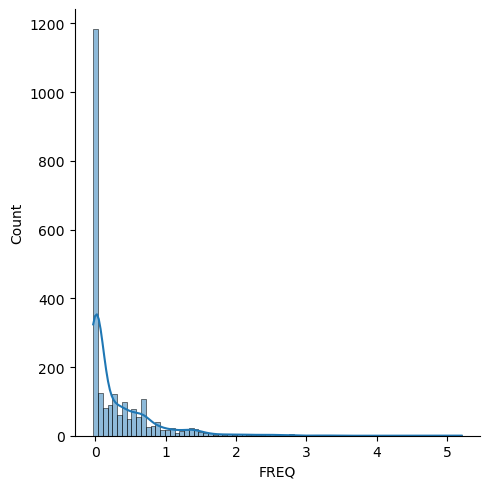

In [59]:
# log de FREQ exclu 0
sns.displot(np.log(train_output["FREQ"][train_output["FREQ"]>0]),kde=True);

In [60]:
from scipy.stats import median_abs_deviation,iqr

In [61]:
# limite le CM min à 228 (seuil d'intervention minimal trouver sur le site de CA) le max avec iqr ou MAD
train_output["CM"] = np.where((train_output["CM"]<228) & (train_output["CM"]>0),228, train_output["CM"]) # reajuster la valeur de charge


In [ ]:
for col in train_output[["CM","FREQ"]] :
    print("---------------")
    print(col)
    print(col,"outlier sup MAD (sans 0)", np.median(train_output[col][train_output[col]>0]) + 3.5*median_abs_deviation(train_output[col][train_output[col]>0]))
    print(col,"outlier sup IQR (sans 0)", np.quantile(train_output[col][train_output[col]>0],0.75) + 1.5*iqr(train_output[col][train_output[col]>0]))
    print(col,"outlier sup IQR (avec 0)", np.quantile(train_output[col],0.75) + 1.5*iqr(train_output[col]))
    print(col,"outlier sup std (sans 0)", np.mean(train_output[col][train_output[col] >0]) + 2* np.std(train_output[col][train_output[col] >0]))
    print(col,"outlier sup std (avec 0)", np.mean(train_output[col]) + 2* np.std(train_output[col]))
    print("----INF-----")
    print(col,"outlier inf MAD (sans 0)", np.median(train_output[col][train_output[col]>0]) - 3.5*median_abs_deviation(train_output[col][train_output[col]>0]))
    print(col,"outlier inf IQR (sans 0)", np.quantile(train_output[col][train_output[col]>0],0.75) - 1.5*iqr(train_output[col][train_output[col]>0]))
    print(col,"outlier inf IQR (avec 0)", np.quantile(train_output[col],0.75) + 1.5*iqr(train_output[col]))
    print(col,"outlier inf std (sans 0)", np.mean(train_output[col][train_output[col] >0]) - 2* np.std(train_output[col][train_output[col] >0]))
    print(col,"outlier inf std (avec 0)", np.mean(train_output[col]) - 2* np.std(train_output[col]))

---------------
CM
CM outlier sup MAD (sans 0) 7146.324999999999
CM outlier sup IQR (sans 0) 24244.63875
CM outlier sup IQR (avec 0) 0.0
CM outlier sup std (sans 0) 190030.31901848747
CM outlier sup std (avec 0) 13582.565101598937
----INF-----
CM outlier inf MAD (sans 0) -3573.1249999999995
CM outlier inf IQR (sans 0) -4267.06875
CM outlier inf IQR (avec 0) 0.0
CM outlier inf std (sans 0) -130601.02852711058
CM outlier inf std (avec 0) -13217.261102801547
---------------
FREQ
FREQ outlier sup MAD (sans 0) 1.1461864405642903
FREQ outlier sup IQR (sans 0) 2.450216450396006
FREQ outlier sup IQR (avec 0) 0.0
FREQ outlier sup std (sans 0) 9.840390041539521
FREQ outlier sup std (avec 0) 0.7019211094625891
----INF-----
FREQ outlier inf MAD (sans 0) 0.9187853107976165
FREQ outlier inf IQR (sans 0) 0.7099567099207988
FREQ outlier inf IQR (avec 0) 0.0
FREQ outlier inf std (sans 0) -6.480728329864778
FREQ outlier inf std (avec 0) -0.6812697126894888
---------------
ANNEE_ASSURANCE
ANNEE_ASSURANCE

Calcul du nombre de sinistre pour avoir des comptes au lieu de fréquences.  
Comparaison des performances avec l'utilisation de sinistre ou fréquence

In [63]:
# FREQ = nb_sinitre / ANNE ASSURANCE
# Quand l'annee d'assurance est inf à 1 ==> tres grande valeur même si un seul sinistre
train_output["NbSinistre"] = train_output["ANNEE_ASSURANCE"] * train_output["FREQ"]
train_output.describe()

,ID,FREQ,CM,ANNEE_ASSURANCE,CHARGE,NbSinistre
count,383610.000000,383610.000000,383610.000000,383610.000000,383610.000000,383610.000000
mean,191805.500000,0.010326,182.651999,0.701557,186.159351,0.006395
std,110738.812719,0.345798,6699.965284,0.352375,6800.488350,0.083104
min,1.000000,0.000000,0.000000,0.002732,0.000000,0.000000
25%,95903.250000,0.000000,0.000000,0.389041,0.000000,0.000000
50%,191805.500000,0.000000,0.000000,0.882192,0.000000,0.000000
75%,287707.750000,0.000000,0.000000,1.000000,0.000000,0.000000
max,383610.000000,182.499998,500000.000000,2.000000,552000.000000,5.000000


In [65]:
train_output["NbSinistre"].value_counts()
# modifi le type de nbsintre en int

NbSinistre
0.0    381252
1.0      1878
1.0       253
1.0       106
2.0        67
1.0        33
2.0         8
2.0         7
3.0         2
2.0         2
5.0         1
4.0         1
Name: count, dtype: int64

In [66]:
train_output["NbSinistre"] = train_output["NbSinistre"].round(2).astype('int')
train_output["NbSinistre"].value_counts(dropna=False)
# utiliser pour les modelisation
# 381252  381538

NbSinistre
0    381252
1      2270
2        84
3         2
5         1
4         1
Name: count, dtype: int64

In [67]:
# regroupe 2-3-5
train_output["NbSinistre"] = np.where(train_output["NbSinistre"]>2, 2,train_output["NbSinistre"])
train_output["NbSinistre"].value_counts(dropna=False)


NbSinistre
0    381252
1      2270
2        88
Name: count, dtype: int64

In [69]:
# outlier sup des cibles pour differentes méthodes

for col in train_output[["CM","FREQ","NbSinistre"]] :
    print(col)
    print("outlier sup MAD 3.5 (sans 0)", np.median(train_output[col][train_output[col]>0]) + 3.5*median_abs_deviation(train_output[col][train_output[col]>0]))
    print("outlier sup MAD 3 (sans 0)", np.median(train_output[col][train_output[col]>0]) + 3*median_abs_deviation(train_output[col][train_output[col]>0]))
    print("outlier sup MAD 3.29 (sans 0)", np.median(train_output[col][train_output[col]>0]) + 3.29*median_abs_deviation(train_output[col][train_output[col]>0]))
    
    print("outlier sup IQR 1.5 (sans 0)", np.quantile(train_output[col][train_output[col]>0],0.75) + 1.5*iqr(train_output[col][train_output[col]>0]))
    print("outlier sup IQR 3 (sans 0)", np.quantile(train_output[col][train_output[col]>0],0.75) + 3*iqr(train_output[col][train_output[col]>0]))

    print("outlier sup std 2 (sans 0)", np.mean(train_output[col][train_output[col] >0]) + 2* np.std(train_output[col][train_output[col] >0]))
    print("outlier sup std 2.5 (sans 0)", np.mean(train_output[col][train_output[col] >0]) + 2.5* np.std(train_output[col][train_output[col] >0]))
    print("outlier sup std 3 (sans 0)", np.mean(train_output[col][train_output[col] >0]) + 3* np.std(train_output[col][train_output[col] >0]),"\n")

CM
outlier sup MAD 3.5 (sans 0) 7146.324999999999
outlier sup MAD 3 (sans 0) 6380.65
outlier sup MAD 3.29 (sans 0) 6824.7415
outlier sup IQR 1.5 (sans 0) 24244.63875
outlier sup IQR 3 (sans 0) 38500.4925
outlier sup std 2 (sans 0) 190030.31901848747
outlier sup std 2.5 (sans 0) 230109.23746168724
outlier sup std 3 (sans 0) 270188.15590488695 

FREQ
outlier sup MAD 3.5 (sans 0) 1.1461864405642903
outlier sup MAD 3 (sans 0) 1.1299435027238136
outlier sup MAD 3.29 (sans 0) 1.13936440667129
outlier sup IQR 1.5 (sans 0) 2.450216450396006
outlier sup IQR 3 (sans 0) 3.3203463206336092
outlier sup std 2 (sans 0) 9.840390041539521
outlier sup std 2.5 (sans 0) 11.880529837965058
outlier sup std 3 (sans 0) 13.920669634390597 

NbSinistre
outlier sup MAD 3.5 (sans 0) 1.0
outlier sup MAD 3 (sans 0) 1.0
outlier sup MAD 3.29 (sans 0) 1.0
outlier sup IQR 1.5 (sans 0) 1.0
outlier sup IQR 3 (sans 0) 1.0
outlier sup std 2 (sans 0) 1.4164081312942116
outlier sup std 2.5 (sans 0) 1.511180223490114
outlier 

In [70]:
### virer les outliers de FREQ et CM : iqr 1.5 et MAD
# CM  IQR : 230108  MAD : 7146
# FREQ IQR 2.45  STD : 9.8

# créer plusieurs colonne en fonction de la technique d'outliers utilisée
freq_out_std = np.mean(train_output["FREQ"][train_output["FREQ"] >0]) + 2* np.std(train_output["FREQ"][train_output["FREQ"] >0]) 
 # 1.0 abandonne MAD
freq_out_iqr = np.quantile(train_output["FREQ"][train_output["FREQ"]>0],0.75) + 1.5*iqr(train_output["FREQ"][train_output["FREQ"]>0]) 

cm_out_iqr = np.quantile(train_output["CM"][train_output["CM"]>0],0.75) + 1.5*iqr(train_output["CM"][train_output["CM"]>0]) # 24244.63875
cm_out_std = np.mean(train_output["CM"][train_output["CM"] >0]) + 2* np.std(train_output["CM"][train_output["CM"] >0]) # 190027.83630142178
cm_out_mad = np.median(train_output["CM"][train_output["CM"]>0]) + 3.5*median_abs_deviation(train_output["CM"][train_output["CM"]>0]) # 7146

In [71]:
# si valeur inf à limite on met NA
CM_IQR = [cm if cm <= cm_out_iqr else np.nan for cm in train_output["CM"]]
CM_STD = [cm if cm <= cm_out_std else np.nan for cm in train_output["CM"]]

FREQ_STD = [frq if frq <= freq_out_std else np.nan for frq in train_output["FREQ"]]
FREQ_IQR = [frq if frq <= freq_out_iqr else np.nan for frq in train_output["FREQ"]]

train_output["CM_IQR"] = CM_IQR
train_output["CM_STD"] = CM_STD

train_output["FREQ_STD"] = FREQ_STD
train_output["FREQ_IQR"] = FREQ_IQR

train_output.describe()

,ID,FREQ,CM,ANNEE_ASSURANCE,CHARGE,NbSinistre,CM_IQR,CM_STD,FREQ_STD,FREQ_IQR
count,383610.000000,383610.000000,383610.000000,383610.000000,383610.000000,383610.000000,383177.000000,383486.000000,383587.000000,383384.000000
mean,191805.500000,0.010326,182.651999,0.701557,186.159351,0.006376,15.015368,76.197791,0.009008,0.006867
std,110738.812719,0.345798,6699.965284,0.352375,6800.488350,0.082428,375.440786,2555.811794,0.137979,0.095701
min,1.000000,0.000000,0.000000,0.002732,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,95903.250000,0.000000,0.000000,0.389041,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,191805.500000,0.000000,0.000000,0.882192,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,287707.750000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,383610.000000,182.499998,500000.000000,2.000000,552000.000000,2.000000,24144.710000,189000.000000,9.631579,2.449664


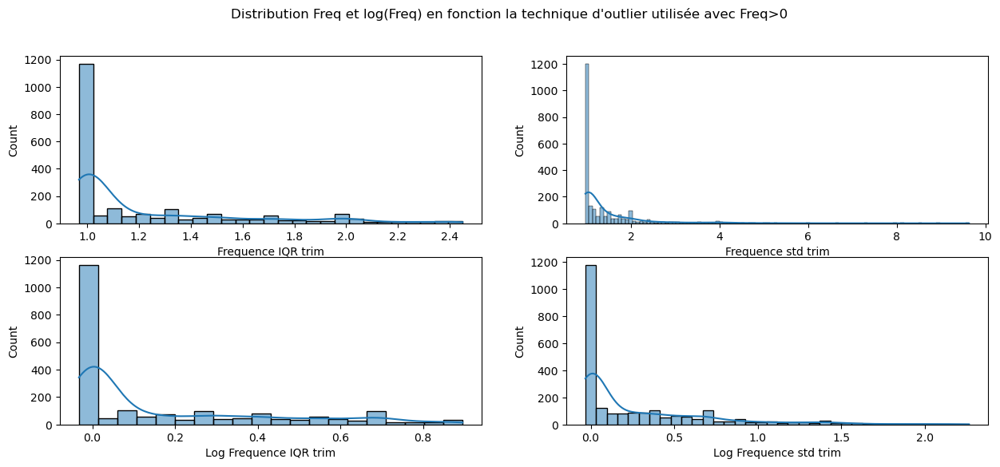

In [72]:
plt.figure(figsize=(15,6))

plt.suptitle("Distribution Freq et log(Freq) en fonction la technique d'outlier utilisée avec Freq>0")
plt.subplot(221)
sns.histplot((train_output["FREQ_IQR"][train_output["FREQ_IQR"]>0]),kde=True)
plt.xlabel("Frequence IQR trim")
plt.subplot(222)
sns.histplot((train_output["FREQ_STD"][train_output["FREQ_STD"]>0]),kde=True)
plt.xlabel("Frequence std trim")


plt.subplot(223)
sns.histplot(np.log(train_output["FREQ_IQR"][train_output["FREQ_IQR"]>0]),kde=True)
plt.xlabel("Log Frequence IQR trim")

plt.subplot(224)
sns.histplot(np.log(train_output["FREQ_STD"][train_output["FREQ_STD"]>0]),kde=True)
plt.xlabel("Log Frequence std trim")

plt.show()

plt.show()

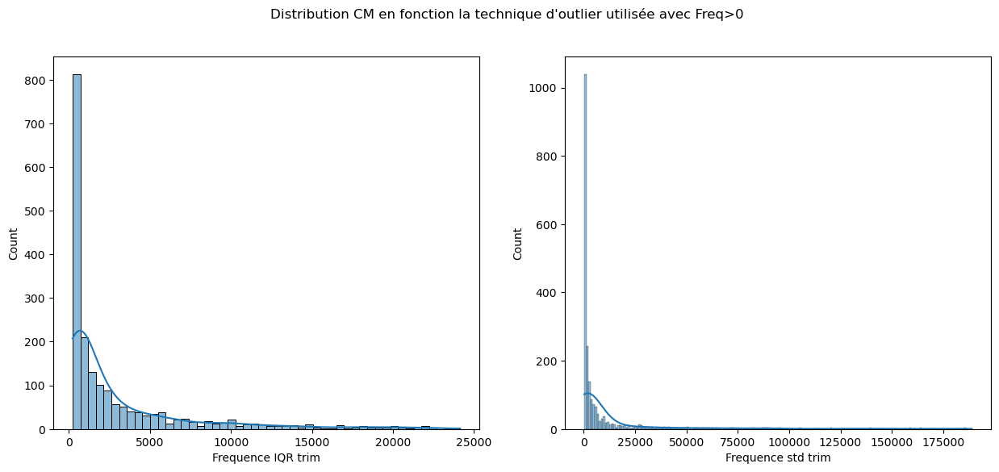

In [73]:
plt.figure(figsize=(15,6))

plt.suptitle("Distribution CM en fonction la technique d'outlier utilisée avec Freq>0")
plt.subplot(121)
sns.histplot((train_output["CM_IQR"][train_output["CM_IQR"]>0]),kde=True)
plt.xlabel("Frequence IQR trim")
plt.subplot(122)
sns.histplot((train_output["CM_STD"][train_output["CM_STD"]>0]),kde=True)
plt.xlabel("Frequence std trim")


plt.show()

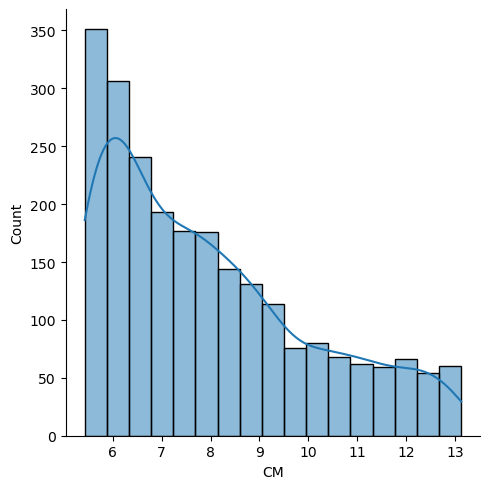

In [74]:
sns.displot(np.log(train_output["CM"][train_output["CM"]>0]),kde=True);

### Preprocessing

In [75]:
train = pd.read_pickle("train_clean_V1.pkl")

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import VarianceThreshold

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import RobustScaler,StandardScaler,OrdinalEncoder
from sklearn.decomposition import PCA

from feature_engine.outliers import Winsorizer

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer 



In [77]:
# maj de charge. round 2 pour etre correct
train = train.drop(["ANNEE_ASSURANCE","ID"], axis = 1)
train_output["CHARGE"] = (train_output["FREQ"] * train_output["CM"] * train_output["ANNEE_ASSURANCE"]).round(2)

X_train,X_test,y_train,y_test = train_test_split(train,train_output, test_size=0.25,stratify=train_output["NbSinistre"], random_state=123)

y_train_freq = y_train[["FREQ"]]
y_test_freq = y_test[["FREQ"]]

y_train_cm = y_train[["CM"]]
y_test_cm = y_test[["CM"]]

y_train_sinistre = y_train["NbSinistre"]
y_test_sinistre = y_test["NbSinistre"]

#### outliers de y 

Frequence : cap les outliers avec IQR   (2.38)   
CM : cap les outliers avec MAD et IQR (7146 et 24244) 

In [ ]:

target_out_iqr_CM = Winsorizer(capping_method="iqr", tail = "right")
target_out_mad_CM = Winsorizer(capping_method="mad", tail = "right",fold=3.5)

target_out_iqr_FREQ = Winsorizer(capping_method="iqr", tail = "right")

In [ ]:
#set les outliers avec methodes std et iqr pour freq et cm

# MAD CM
target_out_mad_CM.fit(y_train_cm[y_train_cm["CM"] > 0])
y_train_cm_out_mad = target_out_mad_CM.transform(y_train_cm)
y_test_cm_out_mad = target_out_mad_CM.transform(y_test_cm)
# IQR CM
target_out_iqr_CM.fit(y_train_cm[y_train_cm["CM"] > 0])
y_train_cm_out_iqr = target_out_iqr_CM.transform(y_train_cm)
y_test_cm_out_iqr = target_out_iqr_CM.transform(y_test_cm)


# IQR FREQ 
target_out_iqr_FREQ.fit(y_train_freq[y_train_freq["FREQ"] > 0])
y_train_freq_out_iqr = target_out_iqr_FREQ.transform(y_train_freq)
y_test_freq_out_iqr = target_out_iqr_FREQ.transform(y_test_freq)



In [81]:
# ajuste la valeur de charge en fonction des outliers
charge_train_iqr = (y_train_cm_out_iqr["CM"] * y_train_freq_out_iqr["FREQ"] * y_train["ANNEE_ASSURANCE"]).round(2)
charge_test_iqr = (y_test_cm_out_iqr["CM"] * y_test_freq_out_iqr["FREQ"] * y_test["ANNEE_ASSURANCE"]).round(2)
y_train["CHARGE_IQR"] = charge_train_iqr
y_test["CHARGE_IQR"] = charge_test_iqr


charge_train_mad = (y_train_cm_out_mad["CM"] * y_train_freq_out_iqr["FREQ"] * y_train["ANNEE_ASSURANCE"]).round(2)
charge_test_mad = (y_test_cm_out_mad["CM"] * y_test_freq_out_iqr["FREQ"] * y_test["ANNEE_ASSURANCE"]).round(2)
y_train["CHARGE_MAD"] = charge_train_mad
y_test["CHARGE_MAD"] = charge_test_mad



In [518]:
print(target_out_mad_CM.right_tail_caps_)
print(target_out_iqr_CM.right_tail_caps_)
print(target_out_iqr_FREQ.right_tail_caps_)


{'CM': 10301.327351962223}
{'CM': 25018.274999999998}
{'FREQ': 2.3298473154413433}


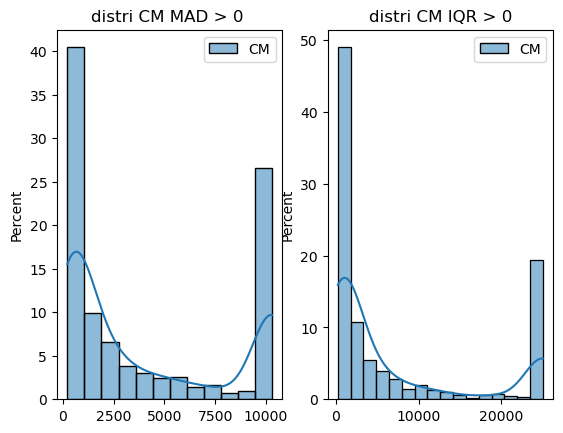

In [86]:
# distribution de CM sans 0
fig, axes = plt.subplots(1, 2)
sns.histplot(y_train_cm_out_mad[y_train_cm_out_mad>0],kde=True,ax = axes[0],stat='percent')
sns.histplot(y_train_cm_out_iqr[y_train_cm_out_iqr>0],kde=True,ax = axes[1],stat='percent')
axes[0].set_title("distri CM MAD > 0 ")
axes[1].set_title("distri CM IQR > 0");

c:\Users\loreb\anaconda3\envs\envCA\Lib\site-packages\pandas\core\internals\blocks.py:393: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
c:\Users\loreb\anaconda3\envs\envCA\Lib\site-packages\pandas\core\internals\blocks.py:393: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


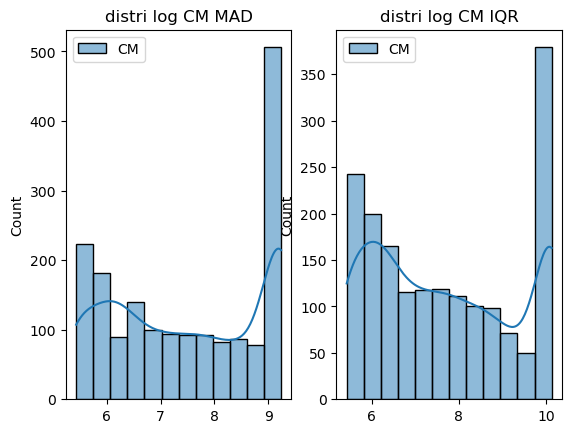

In [87]:
# distribution de freq outlier std au log
fig, axes = plt.subplots(1, 2)
sns.histplot(np.log(y_train_cm_out_mad),kde=True,ax = axes[0])
sns.histplot(np.log(y_train_cm_out_iqr),kde=True,ax = axes[1])
axes[0].set_title("distri log CM MAD")
axes[1].set_title("distri log CM IQR");

In [ ]:
from lightgbm.sklearn import LGBMRegressor
from sklearn.metrics import root_mean_squared_error,make_scorer
from sklearn.model_selection import GridSearchCV


In [89]:
import re
def sorted_moda(df,col_name): 
    """ 
        Sorts the given iterable in the way that is expected.
        fonction lambda convert : si la chaine de caractere est numeric renvoie une int
        fcontcion alphanum_key : scinde une string en fonction des nombres dedans. 
        puis chaque element splité est passé dans convert
        si il y a des nan, c'est à rajouter à part en fin de liste
        
        Required arguments:
        df -- dataframe.
        col_name : nom de la colonne
        
        return : la liste des modalité classé en fonction de la clé numérique
        """
    modalites = df[col_name].value_counts().index # recup les modalités
    
    if re.search(r'([A-Za-z]+)(\d+)', str(modalites[0])) : # si la premiere modalité est composée d'une première part en lettre et seconde en chiffres on fait le sort
        
        convert = lambda text: int(text) if text.isdigit() else text
        alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
        sortedmoda =sorted(modalites, key = alphanum_key)
         
    
    else :
        sortedmoda = sorted(modalites)
    
    if np.nan in train[col_name].value_counts(dropna=False).index : # si il y a des Na met en fin de l'odre
        sortedmoda.append(np.nan) 
    
    return sortedmoda
    
    

In [90]:
categorical_features = train.select_dtypes("object").columns
numerical_features = train.select_dtypes("number").columns

# liste des modalités rangé pour les col object
moda_sorted = [sorted_moda(train,col) for col in categorical_features]

In [ ]:
# corrige la forme des Y

y_train_cm = y_train_cm.values.ravel()
y_test_cm = y_test_cm.values.ravel()


y_train_cm_out_mad = y_train_cm_out_mad.values.ravel()
y_test_cm_out_mad = y_test_cm_out_mad.values.ravel()

y_train_cm_out_iqr = y_train_cm_out_iqr.values.ravel()
y_test_cm_out_iqr = y_test_cm_out_iqr.values.ravel()

y_train_freq_out_iqr = y_train_freq_out_iqr.values.ravel()
y_test_freq_out_iqr = y_test_freq_out_iqr.values.ravel()

y_train_sinistre = y_train_sinistre.values.ravel()
y_test_sinistre = y_test_sinistre.values.ravel()

In [ ]:
# modifier pour gérer les prédit log
def model_eval_pipe(X_train,X_test
                    ,y_train,y_test
                    ,CM_train,CM_test
                    ,FREQ_train,FREQ_test
                    ,model_CM,model_FREQ
                    ,sinistre =False,log=False) : 
    
    # pour CM fit que sur les valeurs positives
    idx_cm_train = CM_train > 0
    idx_cm_test = CM_test > 0
    
    # fit pour CM
    #pipeline_CM.fit(X_train[idx_cm_train],CM_train[idx_cm_train])
    pred_cm_train  = model_CM.predict(X_train[idx_cm_train]) #pred sur CM>0
    pred_cm_test = model_CM.predict(X_test[idx_cm_test])
    
    # pred sur tout CM
    pred_cm_train_full  = model_CM.predict(X_train) # pred sur tout CM
    pred_cm_test_full = model_CM.predict(X_test)
    
    if log : 
        pred_cm_train = np.exp(pred_cm_train)
        pred_cm_test = np.exp(pred_cm_test)
        pred_cm_train_full = np.exp(pred_cm_train_full)
        pred_cm_test_full = np.exp(pred_cm_test_full)
    
    # RMSE sur CM positif
    RMSE_train_CM = root_mean_squared_error(CM_train[idx_cm_train],pred_cm_train) # eval du model sur val pos
    RMSE_test_CM = root_mean_squared_error(CM_test[idx_cm_test],pred_cm_test)
    
    
    # fit pour FREQ
    #pipeline_FREQ.fit(X_train,FREQ_train)
    pred_freq_train  = model_FREQ.predict(X_train)
    pred_freq_test = model_FREQ.predict(X_test)
    RMSE_train_FREQ = root_mean_squared_error(FREQ_train,pred_freq_train)
    RMSE_test_FREQ = root_mean_squared_error(FREQ_test,pred_freq_test)
    
    # pred de charge
    charge_ajustee_train = (CM_train * FREQ_train * y_train["ANNEE_ASSURANCE"]).round(2) # ajuste la charge
    charge_ajustee_test = (CM_test * FREQ_test * y_test["ANNEE_ASSURANCE"]).round(2)
        

    if sinistre :
        charge_pred_train = (pred_cm_train_full * pred_freq_train).round(2)
        charge_pred_test = (pred_cm_test_full * pred_freq_test).round(2)
    else :
        charge_pred_train = (pred_cm_train_full * pred_freq_train * y_train["ANNEE_ASSURANCE"]).round(2)
        charge_pred_test = (pred_cm_test_full * pred_freq_test * y_test["ANNEE_ASSURANCE"]).round(2)
    
    RMSE_charge_train = root_mean_squared_error(charge_ajustee_train,charge_pred_train)
    RMSE_charge_test = root_mean_squared_error(charge_ajustee_test,charge_pred_test)
    
    RMSE_charge_train_pos = root_mean_squared_error(charge_ajustee_train[charge_ajustee_train>0],charge_pred_train[charge_ajustee_train>0])
    RMSE_charge_test_pos = root_mean_squared_error(charge_ajustee_test[charge_ajustee_test>0],charge_pred_test[charge_ajustee_test>0])

    
    rst = {
            "rmse_train_CM" : RMSE_train_CM,
            "rmse_test_CM" : RMSE_test_CM,
            "diff_CM" : RMSE_train_CM - RMSE_test_CM,
            "rmse_train_FREQ" : RMSE_train_FREQ,
            "rmse_test_FREQ" : RMSE_test_FREQ,
            "diff_FREQ" : RMSE_train_FREQ - RMSE_test_FREQ,
            "rmse_train_CHARGE" : RMSE_charge_train,
            "rmse_test_CHARGE" : RMSE_charge_test,
            "diff_CHARGE" : RMSE_charge_train - RMSE_charge_test,
            "rmse_charge_pos_train" : RMSE_charge_train_pos,
            "rmse_charge_pos_test" : RMSE_charge_test_pos,
            "diff_charge_pos" : RMSE_charge_train_pos - RMSE_charge_test_pos
            }
    
    
    return rst


### pipeline 1 : NA remplacer par constante. robust scaler et ordinal encoder

In [ ]:
# preprocessor_1 : ne gere pas les diff % de NA
#   num : simple imputer de NA avec -1 et robustsclaer
#   cat : ordinale encoder avec na = -1 

# val num : simple imputer avec -1
# cat val : ordinal encoder avec na= -1

# Pipeline for numerical features : la ou NA on met - 1 puis robustscaler
numerical_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(add_indicator=True,strategy = "constant", fill_value=-1)),  
    ('scaler', RobustScaler())
])

# Pipeline for categorical features : ordianal encoder avec na = -1 puis rarelabel avec rare = -2
categorical_pipeline = Pipeline(steps=[
    ('encoder', OrdinalEncoder(categories = moda_sorted ,dtype='int',encoded_missing_value=-1,min_frequency = 0.01)) # smin_frequency = 0.01 pour rassembler les rares. prennent la plus grande valeur
])

# Combine pipelines into a ColumnTransformer
preprocessor_1 = ColumnTransformer(
    transformers=[
        ('num', numerical_pipeline, numerical_features),
        ('cat', categorical_pipeline, categorical_features)
        ]
    )



In [30]:
# long encodage donc evite de mettre le classifier dans la pipe
X_train_pipe1 = preprocessor_1.fit_transform(X_train)
X_test_pipe1 = preprocessor_1.transform(X_test)

In [31]:
col_pipe1 = list(preprocessor_1["num"].get_feature_names_out()) + list(preprocessor_1["cat"].get_feature_names_out())

In [32]:
X_train_pipe1 = pd.DataFrame(X_train_pipe1,columns=col_pipe1)
X_test_pipe1 = pd.DataFrame(X_test_pipe1,columns=col_pipe1)

models à tester pour CM : 
avec MAD, avec IQR, avec np.log tous en fonction de objective gamma et RMSE

model à tester pour Freq : 
avec la fréquence, avec le nombre de sinistre  en fonction de objective poisson et RMSE


In [ ]:
########################################################"" RMSLE of 1.052 means that the "average" is 2.86
#  times as big as the true value, or 1/2.86. 

In [ ]:
grid_CM = [{"objective" : ['tweedie'],
           "tweedie_variance_power" : [1,1.5,1.7,1.99]},
           {"objective" : ["gamma","root_mean_squared_error"]}]

grid_FR = [{"objective" : ["tweedie"],
           "tweedie_variance_power" : [1,1.25,1.5,1.75]
           }, 
           {"objective" : ["poisson","root_mean_squared_error"]}]

grilles = [grid_CM,grid_CM,grid_FR,grid_FR]

models_name = ["model_CM_IQR","model_CM_MAD",
               "model_FR","model_sinistre"]
models = [LGBMRegressor()]*4
dico_grille = {}

for md, para, md_name in zip(models,grilles,models_name) :
    dico_grille[md_name] = GridSearchCV(md, param_grid=para, cv = 8
                                        , scoring="neg_root_mean_squared_error")
    
    

In [ ]:
rst_models = {}

for model,grille in dico_grille.items() :
    # train les model avec les cible adéquates
    if model == "model_CM_IQR" : 
        rst_models[model] = grille.fit(X_train_pipe1[y_train_cm_out_iqr>0],y_train_cm_out_iqr[y_train_cm_out_iqr>0])
        
    if model == "model_CM_MAD" : 
        rst_models[model] = grille.fit(X_train_pipe1[y_train_cm_out_mad>0],y_train_cm_out_mad[y_train_cm_out_mad>0])
        
           
    if model == "model_FR" :
        rst_models[model] = grille.fit(X_train_pipe1,y_train_freq_out_iqr)
        
    if model == "model_sinistre" :
        rst_models[model] = grille.fit(X_train_pipe1,y_train_sinistre)

In [85]:
pd.DataFrame(rst_models["model_CM_MAD"].cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_objective,param_tweedie_variance_power,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,mean_test_score,std_test_score,rank_test_score
0,0.188926,0.009438,0.005202,0.004612,tweedie,1.00,"{'objective': 'tweedie', 'tweedie_variance_pow...",-3951.960870,-4228.370809,-4100.479098,-3983.220884,-3978.300370,-3981.237406,-3802.738346,-4095.523328,-4015.228889,118.238633,2
1,0.205839,0.018801,0.004646,0.003436,tweedie,1.50,"{'objective': 'tweedie', 'tweedie_variance_pow...",-3938.904392,-4237.941633,-4249.492352,-4031.654643,-4066.273688,-4156.029370,-3837.891441,-4117.452593,-4079.455014,133.184183,3
2,0.211341,0.040291,0.003162,0.002068,tweedie,1.70,"{'objective': 'tweedie', 'tweedie_variance_pow...",-3913.987751,-4199.560952,-4337.719365,-4079.979084,-4140.564290,-4157.668612,-3999.998811,-4211.378054,-4130.107115,123.262528,4
3,0.200341,0.014101,0.005493,0.004838,tweedie,1.99,"{'objective': 'tweedie', 'tweedie_variance_pow...",-3974.090066,-4414.670497,-4337.130174,-4137.025051,-4222.150988,-4292.998677,-3925.704761,-4285.745993,-4198.689526,162.636552,5
4,0.188599,0.007546,0.003837,0.002389,gamma,NaN,{'objective': 'gamma'},-4008.814566,-4403.467493,-4235.331505,-4223.495028,-4193.422268,-4344.370343,-3945.293798,-4261.776965,-4201.996496,145.472093,6
5,0.194651,0.012202,0.004186,0.001936,root_mean_squared_error,NaN,{'objective': 'root_mean_squared_error'},-3948.597706,-4123.534099,-4079.029701,-3911.820840,-3908.126138,-3933.433225,-3901.729273,-4052.753254,-3982.378030,82.728351,1


In [ ]:
# calcul de RMSE à partir des prédits et actual en log 
def exp_rmse(y_true_log, y_pred_log):
    y_true = np.exp(y_true_log)
    y_pred = np.exp(y_pred_log)
    return root_mean_squared_error(y_true, y_pred)

scorer_exp_rmse = make_scorer(exp_rmse, greater_is_better=False)


# pour model log 

grid_CMLog = [{"objective" : ['tweedie'],
           "tweedie_variance_power" : [1.5,1.7,1.99]},
           {"objective" : ["gamma"]}]

md_log_poisson_tw =LGBMRegressor()
grille_log = GridSearchCV(md_log_poisson_tw, param_grid=grid_CMLog, cv = 10
                    , scoring="neg_root_mean_squared_log_error")
grille_log.fit(X_train_pipe1[y_train_cm>0],y_train_cm[y_train_cm>0])

##############
grid_CMLog = [{"objective" : ['tweedie'],
           "tweedie_variance_power" : [1.5,1.7,1.99]},
           {"objective" : ["gamma"]}]

# voir si score comparables
md_log_poisson_tw =LGBMRegressor()
grille_rmse = GridSearchCV(md_log_poisson_tw, param_grid=grid_CMLog, cv = 10
                    , scoring=scorer_exp_rmse)
grille_rmse.fit(X_train_pipe1[y_train_cm>0],np.log(y_train_cm[y_train_cm>0]))


from sklearn.model_selection import cross_validate

model_log_rmse = LGBMRegressor(objective="root_mean_squared_error")
log_rmse_cv = cross_validate(model_log_rmse,
               X_train_pipe1[y_train_cm>0],np.log(y_train_cm[y_train_cm>0]),
               scoring = scorer_exp_rmse, cv = 10 )
log_rmse_cv['test_score'].mean()



In [60]:
pd.DataFrame(grille_log.cv_results_)
# meilleur avec tweedie 1.7 (RMSE log 0.20) pas d egrand diff entre les modele 

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_objective,param_tweedie_variance_power,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.326198,0.040864,0.007005,0.002523,tweedie,1.50,"{'objective': 'tweedie', 'tweedie_variance_pow...",-2.316582,-2.255945,-2.153740,-2.312930,-2.189472,-2.260640,-2.056047,-2.196032,-2.299429,-2.281436,-2.232225,0.078914,2
1,0.293926,0.028632,0.007673,0.000707,tweedie,1.70,"{'objective': 'tweedie', 'tweedie_variance_pow...",-2.275526,-2.272690,-2.206594,-2.287485,-2.122751,-2.246053,-2.086921,-2.221923,-2.268277,-2.290650,-2.227887,0.067189,1
2,0.352758,0.119524,0.007847,0.001389,tweedie,1.99,"{'objective': 'tweedie', 'tweedie_variance_pow...",-2.377521,-2.325787,-2.212788,-2.340702,-2.288901,-2.328164,-2.096647,-2.192371,-2.267145,-2.338653,-2.276868,0.081861,3
3,0.317555,0.035059,0.008599,0.002005,gamma,NaN,{'objective': 'gamma'},-2.410583,-2.284801,-2.262147,-2.307973,-2.289673,-2.285019,-2.205566,-2.130037,-2.401437,-2.314777,-2.289201,0.078380,4


In [61]:
pd.DataFrame(grille_rmse.cv_results_)
# meilleur avec tweedie 1.7 (RMSE log 0.20) pas d egrand diff entre les modele 

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_objective,param_tweedie_variance_power,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.297424,0.025930,0.006275,0.001126,tweedie,1.50,"{'objective': 'tweedie', 'tweedie_variance_pow...",-69357.812948,-81290.551867,-86642.087334,-81687.510297,-78040.310657,-86138.793618,-96391.841937,-81713.638560,-87220.817752,-60228.085142,-80871.145011,9542.121268,2
1,0.288498,0.012747,0.007537,0.001031,tweedie,1.70,"{'objective': 'tweedie', 'tweedie_variance_pow...",-70098.365273,-81349.720867,-87462.528753,-81955.307944,-77381.716076,-86398.429525,-94542.095670,-81954.948761,-86098.063902,-60636.615468,-80787.779224,9101.579238,1
2,0.287980,0.024136,0.006718,0.001577,tweedie,1.99,"{'objective': 'tweedie', 'tweedie_variance_pow...",-70087.264173,-81020.870156,-86829.380625,-82125.691481,-77542.932605,-86488.234079,-97695.058721,-81761.436863,-86804.235491,-60162.452190,-81051.755638,9713.802863,4
3,0.255038,0.035482,0.005373,0.003402,gamma,NaN,{'objective': 'gamma'},-68981.018877,-81176.590082,-87442.904494,-82137.324605,-77688.800986,-86423.500907,-98211.335323,-81572.866425,-86458.179879,-60069.599121,-81016.212070,9960.416847,3


In [38]:
print("score obj rmse :",  -(log_rmse_cv['test_score'].mean()))

print("score best grille:",  root_mean_squared_error(y_test_cm[y_test_cm>0]
                                                    ,grille_log.best_estimator_.predict(X_test_pipe1[y_test_cm>0])))

print("score best grille rmse:",  root_mean_squared_error(y_test_cm[y_test_cm>0]
                                                    ,np.exp(grille_rmse.best_estimator_.predict(X_test_pipe1[y_test_cm>0]))))


# conserve parametres tweedie 1.7 (RMSE log 0.20)

score obj rmse : 81961.49202590447
score best grille: 83140.13528298761
score best grille rmse: 85223.72234644655


In [39]:
# arg CM IQR, FREQ
arg_CmIQR_Freq = [X_train_pipe1,X_test_pipe1,y_train,y_test
                  ,y_train_cm_out_iqr,y_test_cm_out_iqr
                  ,y_train_freq_out_iqr,y_test_freq_out_iqr]

# arg CM MAD, FREQ
arg_CmMAD_Freq = [X_train_pipe1,X_test_pipe1,y_train,y_test,
                  y_train_cm_out_mad,y_test_cm_out_mad,
                  y_train_freq_out_iqr,y_test_freq_out_iqr]

# arg CM LOG, FREQ
arg_CmLog_Freq = [X_train_pipe1,X_test_pipe1,y_train,y_test,
                  y_train_cm,y_test_cm,y_train_freq_out_iqr,
                  y_test_freq_out_iqr]

# arg CM IQR, sinistre
arg_CmMAD_Sinistre = [X_train_pipe1,X_test_pipe1,y_train,y_test,
                      y_train_cm_out_iqr,y_test_cm_out_iqr,
                      y_train_sinistre,y_test_sinistre]

# arg CM MAD, sinistre
arg_CmMAD_Sinistre = [X_train_pipe1,X_test_pipe1,y_train,y_test,
                      y_train_cm_out_mad,y_test_cm_out_mad,
                      y_train_sinistre,y_test_sinistre]

# arg CM LOG, sinistre
arg_CmLog_Sinistre = [X_train_pipe1,X_test_pipe1,y_train,y_test,
                      y_train,y_test_cm,
                      y_train_sinistre,y_test_sinistre]


In [40]:
tab_rst = pd.DataFrame()

In [41]:
####### avec frequence

#modele avec CM IQR et Frequence
bench_CM_IQR_FREQ = pd.DataFrame(model_eval_pipe(*arg_CmIQR_Freq
                                ,rst_models["model_CM_IQR"].best_estimator_,rst_models["model_FR"].best_estimator_),
                                 index = ["bm_CM_IQR_Fr"] )

#modele avec CM MAD et Frequence
bench_CM_MAD_FREQ = pd.DataFrame(model_eval_pipe(*arg_CmMAD_Freq
                                    ,rst_models["model_CM_MAD"].best_estimator_,rst_models["model_FR"].best_estimator_),
                                    index =["bm_CM_MAD_Fr"])

# modele CM log Frequence
bench_CM_LOG_FREQ = pd.DataFrame(model_eval_pipe(*arg_CmLog_Freq
                                    ,grille_log.best_estimator_,rst_models["model_FR"].best_estimator_)
                                    ,index =["bm_CM_Log_Fr"])

###### avec sinistre

# modele CM IQR et sinistre
bench_CM_IQR_SIN = pd.DataFrame(model_eval_pipe(*arg_CmIQR_Freq
                                   ,rst_models["model_CM_IQR"].best_estimator_,rst_models["model_sinistre"].best_estimator_,
                                   sinistre=True)
                                ,index =["bm_CM_IQR_Sin"])

#modele avec CM MAD et Frequence
bench_CM_MAD_SIN = pd.DataFrame(model_eval_pipe(*arg_CmMAD_Freq
                                   ,rst_models["model_CM_MAD"].best_estimator_,rst_models["model_sinistre"].best_estimator_,
                                   sinistre=True)
                                ,index =["bm_CM_Mad_Sin"])

# modele CM log Frequence
bench_CM_LOG_SIN = pd.DataFrame(model_eval_pipe(*arg_CmLog_Freq
                                   ,grille_log.best_estimator_,rst_models["model_sinistre"].best_estimator_,
                                   sinistre=True)
                                , index =["bm_CM_Log_Sin"])


In [42]:
tab_rst = pd.concat([tab_rst,bench_CM_IQR_FREQ,bench_CM_MAD_FREQ
           ,bench_CM_LOG_FREQ,bench_CM_LOG_SIN
           ,bench_CM_MAD_SIN,bench_CM_LOG_SIN])

In [ ]:
tab_rst 

,rmse_train_CM,rmse_test_CM,diff_CM,rmse_train_FREQ,rmse_test_FREQ,diff_FREQ,rmse_train_CHARGE,rmse_test_CHARGE,diff_CHARGE,rmse_charge_pos_train,rmse_charge_pos_test,diff_charge_pos
bm_CM_IQR_Fr,2736.636297,9408.577553,-6671.941256,0.109832,0.111195,-0.001363,846.886828,914.847352,-67.960524,10775.878887,11701.807837,-925.928950
bm_CM_MAD_Fr,1436.023466,3837.977612,-2401.954146,0.109832,0.111195,-0.001363,412.721451,430.775005,-18.053554,5244.683928,5502.692242,-258.008313
bm_CM_Log_Fr,22097.600041,87314.399071,-65216.799030,0.109832,0.111195,-0.001363,6091.282816,7090.942904,-999.660088,77575.780531,90772.920004,-13197.139473
bm_CM_Log_Sin,22097.600041,87314.399071,-65216.799030,0.111238,0.111146,0.000092,6094.837916,7090.657925,-995.820010,77617.796340,90761.916786,-13144.120447
bm_CM_Mad_Sin,1436.023466,3837.977612,-2401.954146,0.111238,0.111146,0.000092,412.989171,430.987997,-17.998826,5246.916204,5503.405613,-256.489409
bm_CM_Log_Sin,22097.600041,87314.399071,-65216.799030,0.111238,0.111146,0.000092,6094.837916,7090.657925,-995.820010,77617.796340,90761.916786,-13144.120447


In [ ]:
# meilleur modele sur charge : bm_CM_Mad_Sin  412.102813	430.023344	-17.920531
# meilleur modele sur charge positive : bm_CM_Mad_Sin  5234.048142	5490.564934

# tuning des parametres pour cm

In [43]:
for model in rst_models.keys() : 
    print(model)
    print(rst_models[model].best_params_)
    print(rst_models[model].best_score_,"\n")


model_CM_IQR
{'objective': 'root_mean_squared_error'}
-9775.15055431666 

model_CM_MAD
{'objective': 'root_mean_squared_error'}
-4302.386011561749 

model_FR
{'objective': 'tweedie', 'tweedie_variance_power': 1.5}
-0.10954523266367977 

model_sinistre
{'objective': 'tweedie', 'tweedie_variance_power': 1.25}
-0.0822429033750605 



In [841]:
best_model_CM = rst_models["model_CM_MAD"].best_estimator_
best_model_FREQ = rst_models["model_FR"].best_estimator_
best_model_SIN = rst_models["model_sinistre"].best_estimator_

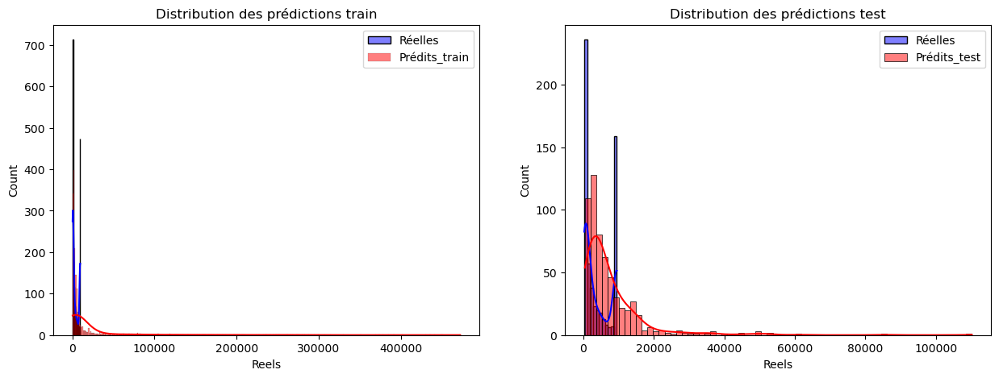

In [69]:
# distrubtion predit reelles avec meilleur modele scoring sur RMSLE

pred_pca_train = grille_log.best_estimator_.predict(X_train_pipe1[y_train_cm>0])
pred_pca_test = grille_log.best_estimator_.predict(X_test_pipe1[y_test_cm>0])


df_res_train = pd.DataFrame({'Reels': y_train_cm_out_mad[y_train_cm>0], 'Prédits': pred_pca_train , 
                        "diff" :y_train_cm_out_mad[y_train_cm>0]-pred_pca_train
                        })

df_res_test = pd.DataFrame({'Reels': y_test_cm_out_mad[y_test_cm>0],
                             'Prédits': pred_pca_test , 
                            "diff" :y_test_cm_out_mad[y_test_cm>0]-pred_pca_test })

df_res_train.reset_index(drop=True, inplace=True)
df_res_test.reset_index(drop=True, inplace=True)

# plot des distibution des prédiction et valeurs réelspl

plt.figure(figsize=(15,5))

plt.subplot(121)
ax = sns.histplot(df_res_train['Reels'], color = 'blue',  kde = True, label = 'Réelles')
sns.histplot(  df_res_train['Prédits'], color = 'red', ax=ax, kde = True, label = 'Prédits_train')
plt.title("Distribution des prédictions train")
plt.legend()


plt.subplot(122)
ax2 = sns.histplot(df_res_test['Reels'], color = 'blue',  kde = True, label = 'Réelles')
sns.histplot(  df_res_test['Prédits'], color = 'red', ax=ax2, kde = True, label = 'Prédits_test')
plt.title("Distribution des prédictions test")
plt.legend();

#### Réduction de dimension PCA 

Regroupe les gros groupes de variables qui décrivent un même type de variables (ex données météo, capital...)

In [ ]:
# interprétation

# regarde la corrélation des variables avec les axes : corrélation + ou - avec la direction principale de variation représenté par un axe X
# ex : variable 1 et 2 sont corrélées négativement à l'axe 1 donc si un point a une coordonnée élevée selon l'axe 1 ==> les valeurs des variables 1 et 2 
# associés à ce point sont faibles

In [674]:
# test_data.filter(regex='CA[0-9]', axis=1)
# DEROG[0-9]

# ^KAPITAL[0-9]

# TAILLE[0-9]

# '^SURFACE[0-9]'

# "^NBBAT[0-9]+$"

# "^RISK[0-9]+$"

# "^EQUIPEMENT[0-9]+$"

# PROPORTION

# DISTANCE

log_ind =['MEN', 'MEN_PAUV', 'MEN_1IND', 'MEN_5IND', 'MEN_PROP', 'MEN_FMP',
       'MEN_COLL', 'MEN_MAIS', 'LOG_AVA1', 'LOG_A1_A2', 'LOG_A2_A3',
       'LOG_APA3', 'LOG_INC', 'LOG_SOC', 'IND', 'IND_0_Y1', 'IND_Y1_Y2',
       'IND_Y2_Y3', 'IND_Y3_Y4', 'IND_Y4_Y5', 'IND_Y5_Y6', 'IND_Y6_Y7',
       'IND_Y7_Y8', 'IND_Y8_Y9', 'IND_Y9', 'IND_INC', 'IND_SNV', 'MEN_SURF']

alt = ['ALTITUDE_1', 'ALTITUDE_2', 'ALTITUDE_3','ALTITUDE_4', 'ALTITUDE_5', 'BDTOPO_BAT_MAX_HAUTEUR_MAX', 'HAUTEUR',
       'HAUTEUR_MAX', 'BDTOPO_BAT_MAX_HAUTEUR', 'NB_CASERNES']


meteo = X_train_pipe1.columns[X_train_pipe1.columns.str.contains("^RR|^FF|^FX|^TX|^TN|^TM|^TAMP|^NBJ",regex=True)]

'^RR|^FF|^FX|^TX|^TN|^TM|^TAMP|^NBJ'

#### **PCA full data set**

In [44]:
pca_full = PCA(0.9)  
PCA_full_train = pca_full.fit_transform(X_train_pipe1)
PCA_full_test = pca_full.transform(X_test_pipe1)

print("shape originale",X_train_pipe1.shape)
print("shape PCA",PCA_full_train.shape)
print(pca_full.explained_variance_ratio_)

# 3 dim

shape originale (287707, 402)
shape PCA (287707, 3)
[0.72191426 0.13786362 0.0892586 ]


In [51]:
# CM
mod_CM_PCA_Full = LGBMRegressor(objective='root_mean_squared_error')
mod_CM_PCA_Full.fit(PCA_full_train[y_train_cm_out_mad>0],y_train_cm_out_mad[y_train_cm_out_mad>0])

# FR
mod_FR_PCA_Full = LGBMRegressor(objective='tweedie', tweedie_variance_power=1.25)
mod_FR_PCA_Full.fit(PCA_full_train, y_train_freq_out_iqr)

#SINISTRE
mod_SIN_PCA_Full = LGBMRegressor(objective='tweedie', tweedie_variance_power=1.25)
mod_SIN_PCA_Full.fit(PCA_full_train, y_train_sinistre)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1768, number of used features: 3
[LightGBM] [Info] Start training from score 4073,898707
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000654 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 287707, number of used features: 3
[LightGBM] [Info] Start training from score -4,809726
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000673 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bi

LGBMRegressor(objective='tweedie', tweedie_variance_power=1.25)

In [52]:
# rst modele ACP full avec freq
rst_PCA_Full_freq = model_eval_pipe(PCA_full_train,PCA_full_test,
                                    y_train,y_test, y_train_cm_out_mad,y_test_cm_out_mad, y_train_freq_out_iqr,y_test_freq_out_iqr,
                                    mod_CM_PCA_Full,mod_FR_PCA_Full)

# rst modele ACP full avec sinistre
rst_PCA_Full_sin = model_eval_pipe(PCA_full_train,PCA_full_test,
                                y_train,y_test, y_train_cm_out_mad,y_test_cm_out_mad, y_train_sinistre,y_test_sinistre,
                                   mod_CM_PCA_Full,mod_SIN_PCA_Full,sinistre=True)

In [53]:
tab_rst = pd.concat([tab_rst,
           pd.DataFrame(rst_PCA_Full_freq, index = ["ACP_Full_fr"]),
           pd.DataFrame(rst_PCA_Full_sin,index = ["ACP_Full_sin"])])
tab_rst

,rmse_train_CM,rmse_test_CM,diff_CM,rmse_train_FREQ,rmse_test_FREQ,diff_FREQ,rmse_train_CHARGE,rmse_test_CHARGE,diff_CHARGE,rmse_charge_pos_train,rmse_charge_pos_test,diff_charge_pos
bm_CM_IQR_Fr,3387.992871,9199.238544,-5811.245673,0.108159,0.114111,-0.005952,911.171395,874.514115,36.657280,11608.301801,11133.744164,474.557637
bm_CM_MAD_Fr,1556.291564,4187.640065,-2631.348501,0.108159,0.114111,-0.005952,448.580893,438.959590,9.621303,5713.327549,5587.249730,126.077819
bm_CM_Log_Fr,23904.500569,83140.135283,-59235.634714,0.108159,0.114111,-0.005952,6381.960546,6311.718669,70.241877,81404.093704,80463.993538,940.100167
bm_CM_Log_Sin,23904.500569,83140.135283,-59235.634714,0.107744,0.114130,-0.006386,6309.228046,6311.796974,-2.568929,80463.429590,80451.546071,11.883519
bm_CM_Mad_Sin,1556.291564,4187.640065,-2631.348501,0.107744,0.114130,-0.006386,444.310066,439.128225,5.181840,5652.766069,5582.515475,70.250593
bm_CM_Log_Sin,23904.500569,83140.135283,-59235.634714,0.107744,0.114130,-0.006386,6309.228046,6311.796974,-2.568929,80463.429590,80451.546071,11.883519
ACP_Full_fr,3459.259579,4344.010798,-884.751219,0.109168,0.114209,-0.005041,452.718472,439.027491,13.690981,5759.932324,5582.047122,177.885202
ACP_Full_sin,3459.259579,4344.010798,-884.751219,0.082010,0.082338,-0.000328,411.075053,369.584012,41.491040,5226.399381,4692.199968,534.199413


In [ ]:
# PCA_full data 
# CM : moins bon de 1000 sur le test mais beaucoup moins d'overfitting
# FR : similaires
# charge : même resultats (avec à peine moins d'overfit)
# charge positive : léger moins d'overfit


#### **PCA sur groupe de variables**

Pour éviter d'avoir de la perte d'information, ACP sur des groupes de variables à priori liées (méteo ...)

In [ ]:
# PCA sur certaines groupes de variables (méteorologiques)
# garder une certaine interprétabilité

**meteo**

In [ ]:
# colonnes de vent, pluie, température qui a bcp de colonne (130)
meteo = X_train_pipe1.columns[X_train_pipe1.columns.str.contains("^RR|^FF|^FX|^TX|^TN|^TM|^TAMP|^NBJ",regex=True)]


In [55]:
pca_meteo = PCA(0.9)  # project from 64 to 2 dimensions
PCA_meteo_train = pca_meteo.fit_transform(X_train_pipe1[meteo])
PCA_meteo_test = pca_meteo.transform(X_test_pipe1[meteo])

print("shape originale",X_train_pipe1[meteo].shape)
print("shape PCA",PCA_meteo_train.shape)
print(pca_meteo.explained_variance_ratio_)

# 4 dime contre 130

shape originale (287707, 130)
shape PCA (287707, 4)
[0.79111389 0.06762703 0.03816537 0.0246485 ]


In [56]:
# concat de df encodé et des colonne ACP météo

PCA_meteo_train = pd.concat([X_train_pipe1.drop(meteo,axis =1),
                             pd.DataFrame(PCA_meteo_train,columns=["cp1_meteo","cp2_meteo","cp3_meteo","cp4_meteo"])],axis = 1)

PCA_meteo_test = pd.concat([X_test_pipe1.drop(meteo,axis =1),
                             pd.DataFrame(PCA_meteo_test,columns=["cp1_meteo","cp2_meteo","cp3_meteo","cp4_meteo"])],axis=1)


In [ ]:
# entrainement avec les paramètres ayant obtenue les meilleurs rst précedemment

# CM
mod_CM_PCA_meteo = LGBMRegressor(objective='tweedie', tweedie_variance_power=1)
mod_CM_PCA_meteo.fit(PCA_meteo_train[y_train_cm_out_mad>0],y_train_cm_out_mad[y_train_cm_out_mad>0])

# FREQ
mod_FR_PCA_meteo = LGBMRegressor(objective='tweedie', tweedie_variance_power=1.25)
mod_FR_PCA_meteo.fit(PCA_meteo_train, y_train_freq_out_iqr)

# sinistre
mod_SIN_PCA_meteo = LGBMRegressor(objective='tweedie', tweedie_variance_power=1.25)
mod_SIN_PCA_meteo.fit(PCA_meteo_train, y_train_sinistre)


rst_PCA_meteo_freq = model_eval_pipe(PCA_meteo_train,PCA_meteo_test,
                                    y_train,y_test, y_train_cm_out_mad,y_test_cm_out_mad, y_train_freq_out_iqr,y_test_freq_out_iqr,
                                    mod_CM_PCA_meteo,mod_FR_PCA_meteo)

rst_PCA_meteo_sin = model_eval_pipe(PCA_meteo_train,PCA_meteo_test,
                                y_train,y_test, y_train_cm_out_mad,y_test_cm_out_mad,y_train_sinistre,y_test_sinistre,
                                   mod_CM_PCA_meteo,mod_SIN_PCA_meteo,sinistre=True)

In [58]:
# rst sur Cm mad pour améliorer lecture
tab_CM_mad = tab_rst.loc[["bm_CM_MAD_Fr","bm_CM_Mad_Sin"
             ,"ACP_Full_fr","ACP_Full_sin"]]

In [59]:
tab_CM_mad = pd.concat([tab_CM_mad,
           pd.DataFrame(rst_PCA_meteo_freq, index = ["ACP_meteo_fr"]),
           pd.DataFrame(rst_PCA_meteo_sin,index = ["ACP_meteo_sin"])])


In [60]:
tab_CM_mad # 2

,rmse_train_CM,rmse_test_CM,diff_CM,rmse_train_FREQ,rmse_test_FREQ,diff_FREQ,rmse_train_CHARGE,rmse_test_CHARGE,diff_CHARGE,rmse_charge_pos_train,rmse_charge_pos_test,diff_charge_pos
bm_CM_MAD_Fr,1556.291564,4187.640065,-2631.348501,0.108159,0.114111,-0.005952,448.580893,438.959590,9.621303,5713.327549,5587.249730,126.077819
bm_CM_Mad_Sin,1556.291564,4187.640065,-2631.348501,0.107744,0.114130,-0.006386,444.310066,439.128225,5.181840,5652.766069,5582.515475,70.250593
ACP_Full_fr,3459.259579,4344.010798,-884.751219,0.109168,0.114209,-0.005041,452.718472,439.027491,13.690981,5759.932324,5582.047122,177.885202
ACP_Full_sin,3459.259579,4344.010798,-884.751219,0.082010,0.082338,-0.000328,411.075053,369.584012,41.491040,5226.399381,4692.199968,534.199413
ACP_meteo_fr,1446.087485,4182.495340,-2736.407855,0.106704,0.114095,-0.007391,444.354180,439.026821,5.327359,5659.283810,5587.110082,72.173728
ACP_meteo_sin,1446.087485,4182.495340,-2736.407855,0.080331,0.082233,-0.001902,401.489366,369.562522,31.926844,5110.031792,4697.968665,412.063127


In [ ]:
# acp météo on retrouve l'overfit comme avec df complet (trop d'app sur les variables?corrélation)
# freq same
# charge amélioration peu importante avec plus d'over fit    
# charge pos : plus d'overfit et rst meilleur que base (-500)  (rst similaire a acp full mais over plus)



In [ ]:
# ACP méteo 
# CM un peu moins performant et un peu moins d'overfit
# Freq : mieux avec sinistre
# charge : meilleur de base avec sinistre, overfit leger par rapport à full PCA
# charge pos : meme remark que charge

**ACP info sur logement/individus + meteo**

In [61]:
log_ind =['MEN', 'MEN_PAUV', 'MEN_1IND', 'MEN_5IND', 'MEN_PROP', 'MEN_FMP',
       'MEN_COLL', 'MEN_MAIS', 'LOG_AVA1', 'LOG_A1_A2', 'LOG_A2_A3',
       'LOG_APA3', 'LOG_INC', 'LOG_SOC', 'IND', 'IND_0_Y1', 'IND_Y1_Y2',
       'IND_Y2_Y3', 'IND_Y3_Y4', 'IND_Y4_Y5', 'IND_Y5_Y6', 'IND_Y6_Y7',
       'IND_Y7_Y8', 'IND_Y8_Y9', 'IND_Y9', 'IND_INC', 'IND_SNV', 'MEN_SURF']

In [62]:
# ACP sur le df ACP météo
pca_indiv = PCA(0.9)  
PCA_indiv_train = pca_indiv.fit_transform(PCA_meteo_train[log_ind])
PCA_indiv_test = pca_indiv.transform(PCA_meteo_test[log_ind])

print("shape originale",PCA_meteo_train[log_ind].shape)
print("shape PCA",PCA_indiv_train.shape)
print(pca_indiv.explained_variance_ratio_)


shape originale (287707, 28)
shape PCA (287707, 7)
[0.39947214 0.22625726 0.13178679 0.0617516  0.03747912 0.02881192
 0.01832364]


In [63]:
col_indiv = [f"cp{i}_indiv" for i in np.arange(0,PCA_indiv_train.shape[1])]

In [64]:
# concat des rst
PCA_indiv_train = pd.concat([PCA_meteo_train.drop(log_ind,axis =1),
                             pd.DataFrame(PCA_indiv_train,columns=col_indiv)],axis = 1)

PCA_indiv_test = pd.concat([PCA_meteo_test.drop(log_ind,axis =1),
                             pd.DataFrame(PCA_indiv_test,columns=col_indiv)],axis=1)


In [93]:
PCA_indiv_train.shape

(287707, 255)

In [65]:
# fit des mode

mod_CM_PCA_indiv = LGBMRegressor(objective='root_mean_squared_error')
mod_CM_PCA_indiv.fit(PCA_indiv_train[y_train_cm_out_mad>0],y_train_cm_out_mad[y_train_cm_out_mad>0])

mod_FR_PCA_indiv = LGBMRegressor(objective='tweedie', tweedie_variance_power=1.25)
mod_FR_PCA_indiv.fit(PCA_indiv_train, y_train_freq_out_iqr)

mod_SIN_PCA_indiv = LGBMRegressor(objective='tweedie', tweedie_variance_power=1.25)
mod_SIN_PCA_indiv.fit(PCA_indiv_train, y_train_sinistre)


rst_PCA_indiv_freq = model_eval_pipe(PCA_indiv_train,PCA_indiv_test,
                                    y_train,y_test, y_train_cm_out_mad,y_test_cm_out_mad, y_train_freq_out_iqr,y_test_freq_out_iqr,
                                    mod_CM_PCA_indiv,mod_FR_PCA_indiv)

rst_PCA_indiv_sin = model_eval_pipe(PCA_indiv_train,PCA_indiv_test,
                                y_train,y_test, y_train_cm_out_mad,y_test_cm_out_mad, y_train_sinistre,y_test_sinistre,
                                   mod_CM_PCA_indiv,mod_SIN_PCA_indiv,sinistre=True)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,004165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5033
[LightGBM] [Info] Number of data points in the train set: 1768, number of used features: 214
[LightGBM] [Info] Start training from score 4073,898707
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,050679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5484
[LightGBM] [Info] Number of data points in the train set: 287707, number of used features: 251
[LightGBM] [Info] Start training from score -4,809726
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,044774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] To

In [66]:
tab_CM_mad = pd.concat([tab_CM_mad,
           pd.DataFrame(rst_PCA_indiv_freq, index = ["PCA_indiv_fr"]),
           pd.DataFrame(rst_PCA_indiv_sin,index = ["PCA_indiv_sin"])])
tab_CM_mad

,rmse_train_CM,rmse_test_CM,diff_CM,rmse_train_FREQ,rmse_test_FREQ,diff_FREQ,rmse_train_CHARGE,rmse_test_CHARGE,diff_CHARGE,rmse_charge_pos_train,rmse_charge_pos_test,diff_charge_pos
bm_CM_MAD_Fr,1556.291564,4187.640065,-2631.348501,0.108159,0.114111,-0.005952,448.580893,438.959590,9.621303,5713.327549,5587.249730,126.077819
bm_CM_Mad_Sin,1556.291564,4187.640065,-2631.348501,0.107744,0.114130,-0.006386,444.310066,439.128225,5.181840,5652.766069,5582.515475,70.250593
ACP_Full_fr,3459.259579,4344.010798,-884.751219,0.109168,0.114209,-0.005041,452.718472,439.027491,13.690981,5759.932324,5582.047122,177.885202
ACP_Full_sin,3459.259579,4344.010798,-884.751219,0.082010,0.082338,-0.000328,411.075053,369.584012,41.491040,5226.399381,4692.199968,534.199413
ACP_meteo_fr,1446.087485,4182.495340,-2736.407855,0.106704,0.114095,-0.007391,444.354180,439.026821,5.327359,5659.283810,5587.110082,72.173728
ACP_meteo_sin,1446.087485,4182.495340,-2736.407855,0.080331,0.082233,-0.001902,401.489366,369.562522,31.926844,5110.031792,4697.968665,412.063127
PCA_indiv_fr,1412.991969,4127.045519,-2714.053550,0.106489,0.114133,-0.007644,443.654630,439.080185,4.574445,5646.082812,5583.863426,62.219386
PCA_indiv_sin,1412.991969,4127.045519,-2714.053550,0.080225,0.082229,-0.002003,401.921799,369.483945,32.437854,5110.505511,4691.752678,418.752833


In [ ]:
# pareil que meteo

In [ ]:
# meilleur modele sur charge positive
display(tab_CM_mad.sort_values(by=["rmse_charge_pos_test"]))

# meilleur modele sur charge
display(tab_CM_mad.sort_values(by=["rmse_test_CHARGE"]))

,rmse_train_CM,rmse_test_CM,diff_CM,rmse_train_FREQ,rmse_test_FREQ,diff_FREQ,rmse_train_CHARGE,rmse_test_CHARGE,diff_CHARGE,rmse_charge_pos_train,rmse_charge_pos_test,diff_charge_pos
PCA_indiv_sin,1349.442524,3924.927816,-2575.485291,0.080144,0.082353,-0.002209,361.369486,395.343787,-33.974301,4587.289833,5045.579685,-458.289852
ACP_Full_sin,3169.295757,4134.236002,-964.940245,0.081982,0.082449,-0.000467,369.806346,395.531001,-25.724655,4693.989006,5048.093521,-354.104515
ACP_meteo_sin,1370.389005,3942.381317,-2571.992312,0.080270,0.082347,-0.002077,361.536496,395.273501,-33.737006,4594.102424,5049.892581,-455.790158
PCA_indiv_fr,1349.442524,3924.927816,-2575.485291,0.109577,0.111192,-0.001615,412.205141,430.778339,-18.573199,5237.944138,5502.532174,-264.588036
bm_CM_MAD_Fr,1436.023466,3837.977612,-2401.954146,0.109832,0.111195,-0.001363,412.721451,430.775005,-18.053554,5244.683928,5502.692242,-258.008313
bm_CM_Mad_Sin,1436.023466,3837.977612,-2401.954146,0.111238,0.111146,0.000092,412.989171,430.987997,-17.998826,5246.916204,5503.405613,-256.489409
ACP_Full_fr,3169.295757,4134.236002,-964.940245,0.112683,0.111263,0.001420,420.960873,431.058878,-10.098005,5347.919368,5504.398769,-156.479400
ACP_meteo_fr,1370.389005,3942.381317,-2571.992312,0.109839,0.111227,-0.001388,412.404887,430.864131,-18.459244,5244.159050,5507.481598,-263.322548


,rmse_train_CM,rmse_test_CM,diff_CM,rmse_train_FREQ,rmse_test_FREQ,diff_FREQ,rmse_train_CHARGE,rmse_test_CHARGE,diff_CHARGE,rmse_charge_pos_train,rmse_charge_pos_test,diff_charge_pos
ACP_meteo_sin,1370.389005,3942.381317,-2571.992312,0.080270,0.082347,-0.002077,361.536496,395.273501,-33.737006,4594.102424,5049.892581,-455.790158
PCA_indiv_sin,1349.442524,3924.927816,-2575.485291,0.080144,0.082353,-0.002209,361.369486,395.343787,-33.974301,4587.289833,5045.579685,-458.289852
ACP_Full_sin,3169.295757,4134.236002,-964.940245,0.081982,0.082449,-0.000467,369.806346,395.531001,-25.724655,4693.989006,5048.093521,-354.104515
bm_CM_MAD_Fr,1436.023466,3837.977612,-2401.954146,0.109832,0.111195,-0.001363,412.721451,430.775005,-18.053554,5244.683928,5502.692242,-258.008313
PCA_indiv_fr,1349.442524,3924.927816,-2575.485291,0.109577,0.111192,-0.001615,412.205141,430.778339,-18.573199,5237.944138,5502.532174,-264.588036
ACP_meteo_fr,1370.389005,3942.381317,-2571.992312,0.109839,0.111227,-0.001388,412.404887,430.864131,-18.459244,5244.159050,5507.481598,-263.322548
bm_CM_Mad_Sin,1436.023466,3837.977612,-2401.954146,0.111238,0.111146,0.000092,412.989171,430.987997,-17.998826,5246.916204,5503.405613,-256.489409
ACP_Full_fr,3169.295757,4134.236002,-964.940245,0.112683,0.111263,0.001420,420.960873,431.058878,-10.098005,5347.919368,5504.398769,-156.479400


In [ ]:
# charge pos : ACP full et ACP_indiv avec sinistre (proche de meteo mais moins de dim)
# cahrge full : ACP meteo et ind sin et ACP full mais rst tres prohce et - overfit sur acp full

In [ ]:
# continuer à réduire avec ACP groupe ? bat, surface

#### **Viz des distributions prédit et réelle**

In [67]:
cm_pos_train = y_train_cm_out_mad > 0
cm_pos_test = y_test_cm_out_mad > 0

**distri réelles-prédits modele ACP**

In [ ]:
mod_CM_PCA_Full = LGBMRegressor(**rst_models["model_CM_MAD"].best_params_)
mod_CM_PCA_Full.fit(PCA_full_train[y_train_cm_out_mad>0],y_train_cm_out_mad[y_train_cm_out_mad>0])

pred_pca_test = mod_CM_PCA_Full.predict(PCA_full_test[cm_pos_test])
pred_pca_train = mod_CM_PCA_Full.predict(PCA_full_train[cm_pos_train])


df_res_train = pd.DataFrame({'Reels': y_train_cm_out_mad[cm_pos_train], 'Prédits': pred_pca_train , 
                        "diff" :y_train_cm_out_mad[cm_pos_train]-pred_pca_train
                        })

df_res_test = pd.DataFrame({'Reels': y_test_cm_out_mad[cm_pos_test],
                             'Prédits': pred_pca_test , 
                            "diff" :y_test_cm_out_mad[cm_pos_test]-pred_pca_test })

df_res_train.reset_index(drop=True, inplace=True)
df_res_test.reset_index(drop=True, inplace=True)

# plot des distibution des prédiction et valeurs réelspl

plt.figure(figsize=(15,5))
plt.suptitle("distribution des rélles et prédit modele ACP")
plt.subplot(121)
ax = sns.histplot(df_res_train['Reels'], color = 'blue',  kde = True, label = 'Réelles')
sns.histplot(  df_res_train['Prédits'], color = 'red', ax=ax, kde = True, label = 'Prédits_train')
plt.title("Distribution des réelles et prédictions train")
plt.legend()


plt.subplot(122)
ax2 = sns.histplot(df_res_test['Reels'], color = 'blue',  kde = True, label = 'Réelles')
sns.histplot(  df_res_test['Prédits'], color = 'red', ax=ax2, kde = True, label = 'Prédits_test')
plt.title("Distribution des réelles prédictions test")
plt.legend();

AttributeError: 'GridSearchCV' object has no attribute 'best_params'

La distribution des prédictions est centrée sur la moyenne des prédictions ==> mauvaises prédictions pour les valeurs extrêmes

**distri acp avec fit du modele avec log(CM)**

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1773, number of used features: 3
[LightGBM] [Info] Start training from score 2,011957


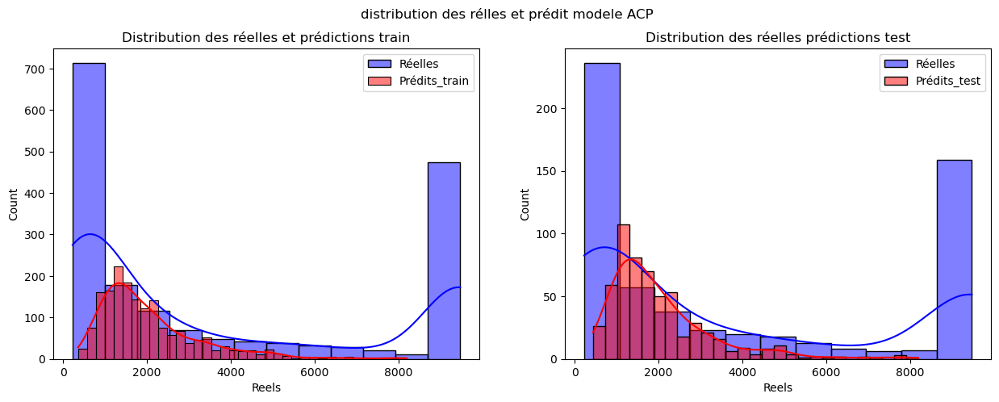

In [ ]:
# avec les CM en log
mod_ACP_log = LGBMRegressor(**rst_models["model_CM_MAD"].best_params)
mod_ACP_log.fit(PCA_full_train[y_train_cm_out_mad>0],np.log(y_train_cm_out_mad[y_train_cm_out_mad>0]))

pred_pca_test = mod_ACP_log.predict(PCA_full_test[cm_pos_test])
pred_pca_train = mod_ACP_log.predict(PCA_full_train[cm_pos_train])

pred_pca_test = np.exp(pred_pca_test)
pred_pca_train = np.exp(pred_pca_train)

df_res_train = pd.DataFrame({'Reels': y_train_cm_out_mad[cm_pos_train], 'Prédits': pred_pca_train , 
                        "diff" :y_train_cm_out_mad[cm_pos_train]-pred_pca_train
                        })

df_res_test = pd.DataFrame({'Reels': y_test_cm_out_mad[cm_pos_test],
                             'Prédits': pred_pca_test , 
                            "diff" :y_test_cm_out_mad[cm_pos_test]-pred_pca_test })

df_res_train.reset_index(drop=True, inplace=True)
df_res_test.reset_index(drop=True, inplace=True)

# plot des distibution des prédiction et valeurs réelspl

plt.figure(figsize=(15,5))
plt.suptitle("distribution des rélles et prédit modele ACP")
plt.subplot(121)
ax = sns.histplot(df_res_train['Reels'], color = 'blue',  kde = True, label = 'Réelles')
sns.histplot(  df_res_train['Prédits'], color = 'red', ax=ax, kde = True, label = 'Prédits_train')
plt.title("Distribution des réelles et prédictions train")
plt.legend()


plt.subplot(122)
ax2 = sns.histplot(df_res_test['Reels'], color = 'blue',  kde = True, label = 'Réelles')
sns.histplot(  df_res_test['Prédits'], color = 'red', ax=ax2, kde = True, label = 'Prédits_test')
plt.title("Distribution des réelles prédictions test")
plt.legend();

En ajustant le modèle avec les valeurs log les distributions des prédites et réelles sont plus similaires

In [ ]:
# résulat de model acp avec transfo log

log_CM = LGBMRegressor(objective='root_mean_squared_error')
log_CM.fit(PCA_full_train[y_train_cm_out_mad>0],np.log(y_train_cm_out_mad[y_train_cm_out_mad>0]))

mod_SIN_PCA_log = LGBMRegressor(objective='tweedie', tweedie_variance_power=1.25)
mod_SIN_PCA_log.fit(PCA_full_train, y_train_sinistre)

rst_ACP_lod =rst_acp_log = model_eval_pipe(PCA_full_train,PCA_full_test,y_train,y_test,
                y_train_cm_out_mad,y_test_cm_out_mad,
                y_train_sinistre,y_test_sinistre,
                log_CM, mod_SIN_PCA_log, sinistre=True, log=True)


In [70]:
tab_CM_mad = pd.concat([tab_CM_mad
           ,pd.DataFrame(rst_ACP_lod,index =["LogCM_ACPfull"])])

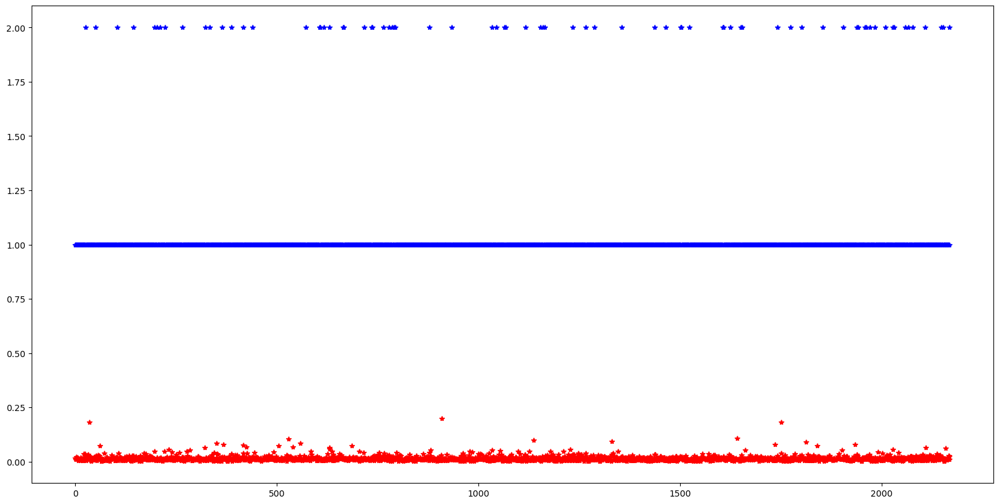

In [1148]:
# pred-obs avec prediction sur > 0 seulement 
plt.figure(figsize=(20,10))
plt.plot(y_train_sinistre[y_train_sinistre>0], "b*")
plt.plot(mod_SIN_PCA_log.predict(PCA_full_train[y_train_sinistre>0]), "r*");

In [71]:
tab_CM_mad

,rmse_train_CM,rmse_test_CM,diff_CM,rmse_train_FREQ,rmse_test_FREQ,diff_FREQ,rmse_train_CHARGE,rmse_test_CHARGE,diff_CHARGE,rmse_charge_pos_train,rmse_charge_pos_test,diff_charge_pos
bm_CM_MAD_Fr,1556.291564,4187.640065,-2631.348501,0.108159,0.114111,-0.005952,448.580893,438.959590,9.621303,5713.327549,5587.249730,126.077819
bm_CM_Mad_Sin,1556.291564,4187.640065,-2631.348501,0.107744,0.114130,-0.006386,444.310066,439.128225,5.181840,5652.766069,5582.515475,70.250593
ACP_Full_fr,3459.259579,4344.010798,-884.751219,0.109168,0.114209,-0.005041,452.718472,439.027491,13.690981,5759.932324,5582.047122,177.885202
ACP_Full_sin,3459.259579,4344.010798,-884.751219,0.082010,0.082338,-0.000328,411.075053,369.584012,41.491040,5226.399381,4692.199968,534.199413
ACP_meteo_fr,1446.087485,4182.495340,-2736.407855,0.106704,0.114095,-0.007391,444.354180,439.026821,5.327359,5659.283810,5587.110082,72.173728
ACP_meteo_sin,1446.087485,4182.495340,-2736.407855,0.080331,0.082233,-0.001902,401.489366,369.562522,31.926844,5110.031792,4697.968665,412.063127
PCA_indiv_fr,1412.991969,4127.045519,-2714.053550,0.106489,0.114133,-0.007644,443.654630,439.080185,4.574445,5646.082812,5583.863426,62.219386
PCA_indiv_sin,1412.991969,4127.045519,-2714.053550,0.080225,0.082229,-0.002003,401.921799,369.483945,32.437854,5110.505511,4691.752678,418.752833
LogCM_ACPfull,4117.053141,4498.063354,-381.010214,0.082010,0.082338,-0.000328,411.545188,369.423167,42.122021,5244.355982,4703.516445,540.839537


La rmse des prédictions augmente un peu mais moins d'overfitting si le modèle de la charge est ajusté avec les valeurs en log.  
Les prédictions sur la charge sont peu affectées  
La métrique du challenge étant la rmse pas ncr de s'y s'intéresser plus ?

#### tuning paramètres 

Tuning des paramètres pour les modèles de frequences et de charge :    
**charge** : - tester les modèles avec variables : ACP, ACP_log_meteo et avec la cible en log

In [72]:
from skopt import BayesSearchCV
from skopt.space import Categorical,Real,Integer
from skopt.callbacks import DeadlineStopper

In [ ]:
# PCA_indiv_train,PCA_inv_test

# PCA_full_train,PCA_full_test

In [73]:
cm_pos_train = y_train_cm_out_mad > 0
cm_pos_test = y_test_cm_out_mad > 0

In [ ]:
md_cm = LGBMRegressor()
md_cm_log = LGBMRegressor()


parameters_Acp_cm = [{
              "objective" : Categorical(["root_mean_squared_error"]),
              'learning_rate': Real(0.01, 0.3, 'log-uniform'),
              "n_estimators" : Integer(150,1000),
              "max_depth": Integer(3,12),
              'num_leaves' : Integer(6,150),
              'colsample_bytree' : Real(0.4,1),
              "min_data_in_leaf" :Integer(10,25)
              }, 
                {"objective" : Categorical(["tweedie"]),
              "tweedie_variance_power" : Real(1,1.99,prior="log-uniform"),
              'learning_rate': Real(0.01, 0.3, 'log-uniform'),
              "n_estimators" : Integer(150,1000),
              "max_depth": Integer(3,12),
              'num_leaves' : Integer(6,150),
              'colsample_bytree' : Real(0.4,1),
              "min_data_in_leaf" :Integer(10,25)
                }]


# search pour MAD SC
bay_cm_acp = BayesSearchCV(md_cm, 
                    search_spaces = parameters_Acp_cm,
                    n_iter=50,
                    cv = 10, scoring = "neg_root_mean_squared_error",
                    n_jobs=-1)


# neg_mean_squared_log_error (met la cible en log auto) (peut poser pb de calcul)
bay_LOGcm_acp = BayesSearchCV(md_cm_log, 
                    search_spaces = parameters_Acp_cm,
                    n_iter=50,
                    cv = 10, scoring = "neg_root_mean_squared_error",
                    n_jobs=-1)


In [ ]:
bay_cm_acp.fit(PCA_full_train[cm_pos_train],y_train_cm_out_mad[cm_pos_train])



In [ ]:
print(bay_cm_acp.best_params_)


OrderedDict({'colsample_bytree': 1.0, 'learning_rate': 0.011164949371846651, 'max_depth': 3, 'min_data_in_leaf': 18, 'n_estimators': 150, 'num_leaves': 6, 'objective': 'root_mean_squared_error', 'subsample': 0.5})


In [77]:
# fit avec le log
bay_LOGcm_acp.fit(PCA_full_train[cm_pos_train],np.log(y_train_cm_out_mad[cm_pos_train]))

[LightGBM] [Warning] min_data_in_leaf is set=21, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=21
[LightGBM] [Warning] min_data_in_leaf is set=21, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=21
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,001743 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1768, number of used features: 3
[LightGBM] [Info] Start training from score 7,529238


BayesSearchCV(cv=10, estimator=LGBMRegressor(), n_jobs=-1,
              scoring='neg_root_mean_squared_error',
              search_spaces=[{'colsample_bytree': Real(low=0.4, high=1, prior='uniform', transform='normalize'),
                              'learning_rate': Real(low=0.01, high=0.3, prior='log-uniform', transform='normalize'),
                              'max_depth': Integer(low=3, high=12, prior='uniform', transform='normalize'),
                              'min_da...
                              'n_estimators': Integer(low=150, high=1000, prior='uniform', transform='normalize'),
                              'num_leaves': Integer(low=6, high=150, prior='uniform', transform='normalize'),
                              'objective': Categorical(categories=('tweedie',), prior=None),
                              'subsample': Real(low=0.5, high=0.9, prior='uniform', transform='normalize'),
                              'tweedie_variance_power': Real(low=1, high=1.99, prior='log-uniform', transform='normalize')}])

In [78]:
print(bay_LOGcm_acp.best_params_)

OrderedDict({'colsample_bytree': 0.4, 'learning_rate': 0.01, 'max_depth': 3, 'min_data_in_leaf': 21, 'n_estimators': 150, 'num_leaves': 6, 'objective': 'root_mean_squared_error', 'subsample': 0.9})


In [ ]:
# tuned pour Frequence

from skopt.callbacks import DeadlineStopper #limite de temps
from skopt.callbacks import DeltaYStopper,EarlyStopper 

md_sinistre = LGBMRegressor(class_weight = "balanced")

parameters_Acp_sin = {"objective" : Categorical(["tweedie"]),
              "tweedie_variance_power" : Real(1,1.99,prior="log-uniform"),
              'learning_rate': Real(0.01, 0.3, 'log-uniform'),
              "n_estimators" : Integer(150,800),
              "max_depth": Integer(3,12),
              'subsample' : Real(0.5,0.9),
              'colsample_bytree' : Real(0.4,1),
              "min_child_samples" :Integer(10,20)
                }
                

from sklearn.model_selection import StratifiedKFold
cv = StratifiedKFold(n_splits=8, shuffle=True, random_state=42)

# tune pour sinistre
stop_delta = DeltaYStopper(delta = 0.001)

bay_sin_MadSc = BayesSearchCV(md_sinistre, 
                    search_spaces = parameters_Acp_sin,
                    n_iter=50,
                    cv = cv, scoring = "neg_root_mean_squared_error"
                    )




In [82]:
bay_sin_MadSc.fit(PCA_full_train,y_train_sinistre,callback=[stop_delta])

[LightGBM] [Warning] min_data_in_leaf is set=17, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=17
[LightGBM] [Warning] min_data_in_leaf is set=17, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=17
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000413 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 230165, number of used features: 3
[LightGBM] [Info] Start training from score 0,000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

BayesSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
              estimator=LGBMRegressor(class_weight='balanced'),
              scoring='neg_root_mean_squared_error',
              search_spaces={'colsample_bytree': Real(low=0.4, high=1, prior='uniform', transform='normalize'),
                             'learning_rate': Real(low=0.01, high=0.3, prior='log-uniform', transform='normalize'),
                             'max_depth': In...
                             'min_data_in_leaf': Integer(low=10, high=20, prior='uniform', transform='normalize'),
                             'n_estimators': Integer(low=150, high=800, prior='uniform', transform='normalize'),
                             'objective': Categorical(categories=('tweedie',), prior=None),
                             'subsample': Real(low=0.5, high=0.9, prior='uniform', transform='normalize'),
                             'tweedie_variance_power': Real(low=1, high=1.99, prior='log-uniform', transform='normalize')})

In [119]:
np.unique(y_train_sinistre, return_counts=True)

(array([0, 1, 2]), array([285934,   1709,     64], dtype=int64))

In [86]:
print(bay_sin_MadSc.best_params_,"\n")


OrderedDict({'colsample_bytree': 0.9936625909885184, 'learning_rate': 0.29999999999999993, 'max_depth': 6, 'min_data_in_leaf': 12, 'n_estimators': 796, 'objective': 'tweedie', 'subsample': 0.7791331473328273, 'tweedie_variance_power': 1.889545527656042}) 



In [ ]:
# ACP, rawCM
rst_tun_ACP = model_eval_pipe(PCA_full_train,PCA_full_test,
                                y_train,y_test, y_train_cm_out_mad,y_test_cm_out_mad, y_train_sinistre,y_test_sinistre,
                                bay_cm_acp.best_estimator_,bay_sin_MadSc.best_estimator_
                                ,sinistre=True)

#ACP log(CM)
rst_tun_ACP_logCM = model_eval_pipe(PCA_full_train,PCA_full_test,
                                y_train,y_test, y_train_cm_out_mad,y_test_cm_out_mad, y_train_sinistre,y_test_sinistre,
                                bay_LOGcm_acp.best_estimator_,bay_sin_MadSc.best_estimator_
                                ,sinistre=True,log=True)




In [ ]:
tab_CM_mad = pd.concat([tab_CM_mad,
           pd.DataFrame(rst_tun_ACP,index = ["tun_ACP"]),
            pd.DataFrame(rst_tun_ACP_logCM,index = ["tun_ACP_logCM"])
            ])


In [132]:
tab_CM_mad.sort_values(by=["rmse_test_CHARGE","diff_CHARGE"])
# top model sur cahrge : ACP full avec logCM / ACP(meteo+indiv) sinitre/ ACP meteo sinistre 
# on conserverair ACP(meteo/indiv) sinistre car -de dim.

,rmse_train_CM,rmse_test_CM,diff_CM,rmse_train_FREQ,rmse_test_FREQ,diff_FREQ,rmse_train_CHARGE,rmse_test_CHARGE,diff_CHARGE,rmse_charge_pos_train,rmse_charge_pos_test,diff_charge_pos
LogCM_ACPfull,4117.053141,4498.063354,-381.010214,0.082010,0.082338,-0.000328,411.545188,369.423167,42.122021,5244.355982,4703.516445,540.839537
PCA_indiv_sin,1412.991969,4127.045519,-2714.053550,0.080225,0.082229,-0.002003,401.921799,369.483945,32.437854,5110.505511,4691.752678,418.752833
ACP_meteo_sin,1446.087485,4182.495340,-2736.407855,0.080331,0.082233,-0.001902,401.489366,369.562522,31.926844,5110.031792,4697.968665,412.063127
ACP_Full_sin,3459.259579,4344.010798,-884.751219,0.082010,0.082338,-0.000328,411.075053,369.584012,41.491040,5226.399381,4692.199968,534.199413
bm_CM_MAD_Fr,1556.291564,4187.640065,-2631.348501,0.108159,0.114111,-0.005952,448.580893,438.959590,9.621303,5713.327549,5587.249730,126.077819
ACP_meteo_fr,1446.087485,4182.495340,-2736.407855,0.106704,0.114095,-0.007391,444.354180,439.026821,5.327359,5659.283810,5587.110082,72.173728
ACP_Full_fr,3459.259579,4344.010798,-884.751219,0.109168,0.114209,-0.005041,452.718472,439.027491,13.690981,5759.932324,5582.047122,177.885202
PCA_indiv_fr,1412.991969,4127.045519,-2714.053550,0.106489,0.114133,-0.007644,443.654630,439.080185,4.574445,5646.082812,5583.863426,62.219386
bm_CM_Mad_Sin,1556.291564,4187.640065,-2631.348501,0.107744,0.114130,-0.006386,444.310066,439.128225,5.181840,5652.766069,5582.515475,70.250593
tun_ACP_logCM,4647.363826,4505.278523,142.085302,0.491165,0.495698,-0.004533,967.135638,969.668708,-2.533070,4386.409259,4313.371962,73.037297


In [119]:
tab_CM_mad.sort_values(by="rmse_charge_pos_test")
# top models : ACP tuned > ACP tuned logCM

,rmse_train_CM,rmse_test_CM,diff_CM,rmse_train_FREQ,rmse_test_FREQ,diff_FREQ,rmse_train_CHARGE,rmse_test_CHARGE,diff_CHARGE,rmse_charge_pos_train,rmse_charge_pos_test,diff_charge_pos
tun_ACP,4052.059235,4083.757509,-31.698274,0.491165,0.495698,-0.004533,1999.583887,2010.658388,-11.074501,4063.373795,4287.254277,-223.880481
tun_ACP_logCM,4647.363826,4505.278523,142.085302,0.491165,0.495698,-0.004533,967.135638,969.668708,-2.533070,4386.409259,4313.371962,73.037297
PCA_indiv_sin,1412.991969,4127.045519,-2714.053550,0.080225,0.082229,-0.002003,401.921799,369.483945,32.437854,5110.505511,4691.752678,418.752833
ACP_Full_sin,3459.259579,4344.010798,-884.751219,0.082010,0.082338,-0.000328,411.075053,369.584012,41.491040,5226.399381,4692.199968,534.199413
ACP_meteo_sin,1446.087485,4182.495340,-2736.407855,0.080331,0.082233,-0.001902,401.489366,369.562522,31.926844,5110.031792,4697.968665,412.063127
LogCM_ACPfull,4117.053141,4498.063354,-381.010214,0.082010,0.082338,-0.000328,411.545188,369.423167,42.122021,5244.355982,4703.516445,540.839537
ACP_Full_fr,3459.259579,4344.010798,-884.751219,0.109168,0.114209,-0.005041,452.718472,439.027491,13.690981,5759.932324,5582.047122,177.885202
bm_CM_Mad_Sin,1556.291564,4187.640065,-2631.348501,0.107744,0.114130,-0.006386,444.310066,439.128225,5.181840,5652.766069,5582.515475,70.250593
PCA_indiv_fr,1412.991969,4127.045519,-2714.053550,0.106489,0.114133,-0.007644,443.654630,439.080185,4.574445,5646.082812,5583.863426,62.219386
ACP_meteo_fr,1446.087485,4182.495340,-2736.407855,0.106704,0.114095,-0.007391,444.354180,439.026821,5.327359,5659.283810,5587.110082,72.173728


[LightGBM] [Warning] min_data_in_leaf is set=18, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=18


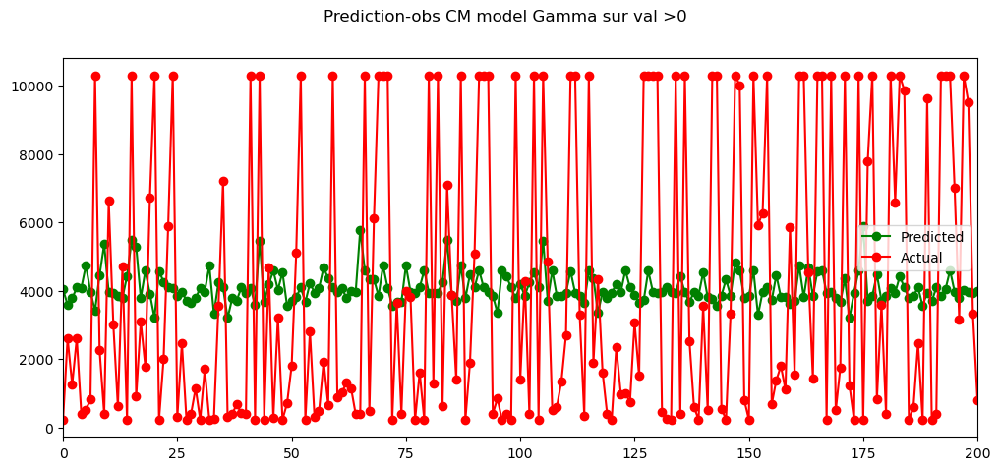

In [122]:
fig = plt.figure(figsize=(12,5))
fig.suptitle('Prediction-obs CM model Gamma sur val >0')
plt.plot(range(0,len(y_train_cm_out_mad[y_train_cm_out_mad>0])), bay_cm_acp.best_estimator_.predict(PCA_full_train[y_train_cm_out_mad>0]), 'go-', label='Predicted')
plt.plot(range(0,len(y_train_cm_out_mad[y_train_cm_out_mad >0])), y_train_cm_out_mad[y_train_cm_out_mad >0], 'ro-', label='Actual')
plt.legend()
plt.xlim(0,200)
plt.show()

# tres mauvaise prediction des valeur au dessus de 0
# cut valeur < 200 150

[LightGBM] [Warning] min_data_in_leaf is set=18, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=18


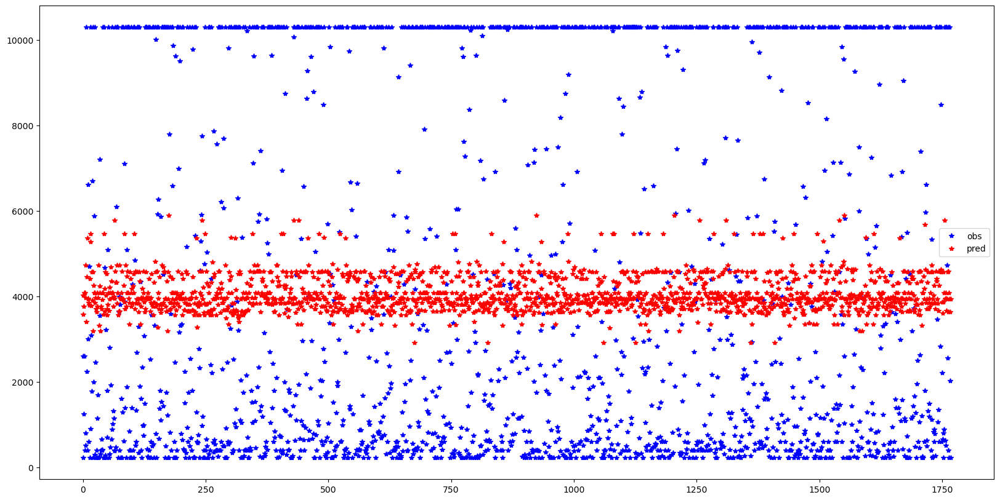

In [123]:
# pred-obs avec prediction sur > 0 seulement
plt.figure(figsize=(20,10))
plt.plot(y_train_cm_out_mad[y_train_cm_out_mad>0], "b*", label = "obs")
plt.plot(bay_cm_acp.best_estimator_.predict(PCA_full_train[y_train_cm_out_mad>0]), "r*", label = "pred")
plt.legend();

#### Oversampling freqence et sinistre

Fort Déséquilibre dans le nombre de sinistre ==> essaie avec randomUderSampling et SMOTE pour réduire le nombre de 0 et augmenter les données

In [128]:
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE
# pas tres correct de faire SMOTE avec varaibles cat mais essaie quand meme 
# np.round(X_train[categorical_variables]) pour éviter d'avoir des valeur en float 

In [129]:
np.unique(y_train_sinistre,return_counts=True)

(array([0, 1, 2]), array([285939,   1702,     66], dtype=int64))

In [ ]:
# undersample les 0
rus = RandomUnderSampler(random_state=12,sampling_strategy= {0 : 50000, 1:np.unique(y_train_sinistre,return_counts=True)[1][1]
                                                             , 2 : np.unique(y_train_sinistre,return_counts=True)[1][2]})
X_rus, sinistre_rus = rus.fit_resample(PCA_full_train,y_train_sinistre)


In [ ]:
# smote avec random unndersample du nb de sinistre
smt = SMOTE(random_state=12,k_neighbors = 10,sampling_strategy = {0 : 50000, 1:30000, 2 : 20000})
X_smt, sinistre_smt = smt.fit_resample(X_rus,sinistre_rus)


In [133]:
# ACP, rawCM
md_cm_smt = LGBMRegressor(**bay_cm_acp.best_params_)
md_sin_smt = LGBMRegressor(**bay_sin_MadSc.best_params_)

md_cm_smt.fit(PCA_full_train[y_train_cm_out_mad>0],y_train_cm_out_mad[y_train_cm_out_mad>0])
md_sin_smt.fit(X_smt,sinistre_smt)


rst_SMT = model_eval_pipe(PCA_full_train,PCA_full_test,
                                y_train,y_test,
                                 y_train_cm_out_mad,y_test_cm_out_mad,
                                 y_train_sinistre,y_test_sinistre,
                                md_cm_smt,md_sin_smt
                                ,sinistre=True)

#ACP log(CM)

md_cm_smt_log = LGBMRegressor(**bay_LOGcm_acp.best_params_)
md_cm_smt_log.fit(PCA_full_train[y_train_cm_out_mad>0],np.log(y_train_cm_out_mad[y_train_cm_out_mad>0]))

rst_log_SMT = model_eval_pipe(PCA_full_train,PCA_full_test,
                                y_train,y_test,
                                y_train_cm_out_mad,y_test_cm_out_mad,
                                y_train_sinistre,y_test_sinistre,
                                md_cm_smt_log,md_sin_smt
                                ,sinistre=True,log=True)



[LightGBM] [Warning] min_data_in_leaf is set=18, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=18
[LightGBM] [Warning] min_data_in_leaf is set=18, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=18
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1768, number of used features: 3
[LightGBM] [Info] Start training from score 4073,898707
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

In [134]:
pd.concat([tab_CM_mad,
           pd.DataFrame(rst_SMT, index=["PCA_SMT"]),
           pd.DataFrame(rst_log_SMT, index=["PCA_Log_SMT"])]).tail()

,rmse_train_CM,rmse_test_CM,diff_CM,rmse_train_FREQ,rmse_test_FREQ,diff_FREQ,rmse_train_CHARGE,rmse_test_CHARGE,diff_CHARGE,rmse_charge_pos_train,rmse_charge_pos_test,diff_charge_pos
LogCM_ACPfull,4117.053141,4498.063354,-381.010214,0.082010,0.082338,-0.000328,411.545188,369.423167,42.122021,5244.355982,4703.516445,540.839537
tun_ACP,4052.059235,4083.757509,-31.698274,0.491165,0.495698,-0.004533,1999.583887,2010.658388,-11.074501,4063.373795,4287.254277,-223.880481
tun_ACP_logCM,4647.363826,4505.278523,142.085302,0.491165,0.495698,-0.004533,967.135638,969.668708,-2.533070,4386.409259,4313.371962,73.037297
PCA_SMT,4052.059235,4083.757509,-31.698274,0.468232,0.507809,-0.039577,1937.055630,2081.103751,-144.048121,4299.194088,4145.532714,153.661373
PCA_Log_SMT,4647.363826,4505.278523,142.085302,0.468232,0.507809,-0.039577,944.412448,1000.793650,-56.381202,4635.582304,4301.909168,333.673136


[LightGBM] [Warning] min_data_in_leaf is set=12, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=12


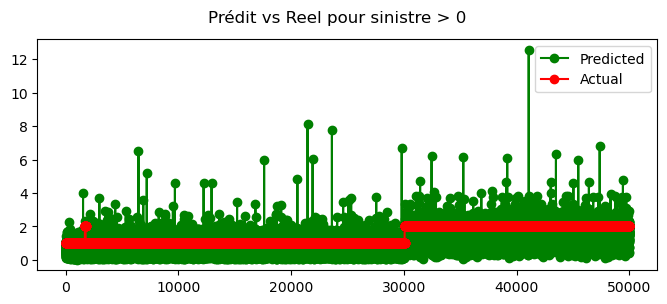

In [135]:
fig = plt.figure(figsize=(8,3))
fig.suptitle('Prédit vs Reel pour sinistre > 0')
plt.plot(range(0,len(sinistre_smt[sinistre_smt>=1])), md_sin_smt.predict(X_smt[sinistre_smt>=1]), 'go-', label='Predicted')
plt.plot(range(0,len(sinistre_smt[sinistre_smt>=1])), sinistre_smt[sinistre_smt>=1], 'ro-', label='Actual')
plt.legend()
plt.show()



#### Retrait des variables corrélées

In [ ]:
# sur les features apres les deux ACP

In [ ]:
## scs
# virer les colonnes corrélées 2 strat :  smartcorrelationselection
from feature_engine.selection import SmartCorrelatedSelection


In [137]:
# fit de smartcorrfeat pour en fonction des performances de CM : donc que sur ses val positives
# model LGBM comme performer

scs_cm = SmartCorrelatedSelection(threshold=0.7,method = "spearman", selection_method = "model_performance"
                             ,scoring = "neg_root_mean_squared_error",cv = 5,estimator = LGBMRegressor(objective="root_mean_squared_error"))

scs_cm.fit(PCA_indiv_train[y_train_cm_out_mad>0],y_train_cm_out_mad[y_train_cm_out_mad>0])

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 1414, number of used features: 1
[LightGBM] [Info] Start training from score 4136,035641
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

SmartCorrelatedSelection(cv=5,
                         estimator=LGBMRegressor(objective='root_mean_squared_error'),
                         method='spearman',
                         scoring='neg_root_mean_squared_error',
                         selection_method='model_performance', threshold=0.7)

In [139]:
len(scs_cm.features_to_drop_)

124

In [141]:
# DF de smartcorr fit sur CM
# df avec drop des varaibles corrélées et SC
PCA_train_scs_CM = scs_cm.transform(PCA_indiv_train)
PCA_test_scs_CM = scs_cm.transform(PCA_indiv_test)

In [ ]:
# smartcorrelation sur le nombre sinistre. en fonction des perfs LGBM 

scs_pois = SmartCorrelatedSelection(threshold=0.7,method = "spearman", selection_method = "model_performance",
                             scoring = "neg_root_mean_squared_error",cv = cv,
                             estimator = LGBMRegressor(objective= 'tweedie', tweedie_variance_power = 1.25))
scs_pois.fit(PCA_indiv_train,y_train_sinistre)

In [145]:
# nb de features drop pour sinistre
len(scs_pois.features_to_drop_)

126

In [146]:
# DF de smart fit sur FREQ 
# df avec drop des varaibles corrélées et SC
PCA_train_scs_SIN = scs_pois.transform(PCA_indiv_train)
PCA_test_scs_SIN = scs_pois.transform(PCA_indiv_test)

In [147]:
set(scs_cm.features_to_drop_) - (set(scs_pois.features_to_drop_))

{'DEROG4',
 'DISTANCE_335',
 'EQUIPEMENT7',
 'KAPITAL21',
 'KAPITAL23',
 'KAPITAL32',
 'KAPITAL33',
 'NBBAT2',
 'RISK5',
 'SURFACE7',
 'SURFACE8',
 'SURFACE9',
 'TAILLE1',
 'TAILLE4'}

In [148]:
len(set(PCA_train_scs_CM.columns).difference(set(PCA_train_scs_SIN.columns))) 
# nb colonnes de scs CM qui manque a fr


16

In [150]:
# combiner les colonnes de FR et CM
col_corr_scs = list(set(PCA_train_scs_CM.columns).union(set(PCA_train_scs_SIN.columns)))

In [159]:
col_corr_scs

['DEROG5',
 'NBBAT3',
 'DISTANCE_335',
 'PROPORTION_23',
 'RISK12',
 'DEROG2',
 'NBBAT9',
 'CA2',
 'RISK9',
 'DEROG14',
 'KAPITAL34',
 'PROPORTION_32',
 'KAPITAL16',
 'SURFACE12',
 'KAPITAL3',
 'CA1',
 'ANCIENNETE',
 'DEROG6',
 'DEROG13',
 'KAPITAL5',
 'KAPITAL40',
 'KAPITAL32',
 'ZONE',
 'missingindicator_KAPITAL16',
 'CARACT4',
 'KAPITAL25',
 'INDEM1',
 'PROPORTION_33',
 'KAPITAL19',
 'KAPITAL36',
 'PROPORTION_22',
 'DEROG15',
 'missingindicator_SURFACE7',
 'KAPITAL33',
 'SURFACE9',
 'KAPITAL27',
 'SURFACE6',
 'missingindicator_KAPITAL23',
 'KAPITAL15',
 'KAPITAL24',
 'FRCH2',
 'cp2_meteo',
 'SURFACE16',
 'missingindicator_KAPITAL20',
 'TYPERS',
 'SURFACE10',
 'COEFASS',
 'SURFACE13',
 'RISK1',
 'PROPORTION_24',
 'ZONE_VENT',
 'DUREE_REQANEUF',
 'SURFACE17',
 'DEROG4',
 'KAPITAL42',
 'SURFACE20',
 'missingindicator_KAPITAL11',
 'NBBAT5',
 'missingindicator_KAPITAL24',
 'CARACT5',
 'KAPITAL11',
 'KAPITAL18',
 'AN_EXERC',
 'KAPITAL14',
 'NBBAT11',
 'KAPITAL12',
 'missingindicator_KAPIT

In [154]:
print("nb col origine",PCA_indiv_train.shape)
print("nb col post sel",len(col_corr_scs))

nb col origine (287707, 255)
nb col post sel 145


In [155]:
ACP_scs_train = PCA_indiv_train[col_corr_scs]
ACP_scs_test = PCA_indiv_test[col_corr_scs]

In [ ]:
# modele "basique" apres le drop des features
mod_CM_scs = LGBMRegressor(objective='root_mean_squared_error')
mod_CM_scs.fit(ACP_scs_train[y_train_cm_out_mad>0],y_train_cm_out_mad[y_train_cm_out_mad>0])

mod_SIN_scs = LGBMRegressor(objective='tweedie', tweedie_variance_power=1.25)
mod_SIN_scs.fit(ACP_scs_train, y_train_sinistre)


rst_scs = model_eval_pipe(ACP_scs_train,ACP_scs_test,
                                y_train,y_test, y_train_cm_out_mad,y_test_cm_out_mad, y_train_sinistre,y_test_sinistre,
                                   mod_CM_scs,mod_SIN_scs,sinistre=True)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,002549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3363
[LightGBM] [Info] Number of data points in the train set: 1768, number of used features: 111
[LightGBM] [Info] Start training from score 4073,898707
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,030966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3578
[LightGBM] [Info] Number of data points in the train set: 287707, number of used features: 141
[LightGBM] [Info] Start training from score -5,055443


In [158]:
pd.concat([tab_CM_mad,
           pd.DataFrame(rst_scs,index = ["SCS"])])

,rmse_train_CM,rmse_test_CM,diff_CM,rmse_train_FREQ,rmse_test_FREQ,diff_FREQ,rmse_train_CHARGE,rmse_test_CHARGE,diff_CHARGE,rmse_charge_pos_train,rmse_charge_pos_test,diff_charge_pos
bm_CM_MAD_Fr,1556.291564,4187.640065,-2631.348501,0.108159,0.114111,-0.005952,448.580893,438.959590,9.621303,5713.327549,5587.249730,126.077819
bm_CM_Mad_Sin,1556.291564,4187.640065,-2631.348501,0.107744,0.114130,-0.006386,444.310066,439.128225,5.181840,5652.766069,5582.515475,70.250593
ACP_Full_fr,3459.259579,4344.010798,-884.751219,0.109168,0.114209,-0.005041,452.718472,439.027491,13.690981,5759.932324,5582.047122,177.885202
ACP_Full_sin,3459.259579,4344.010798,-884.751219,0.082010,0.082338,-0.000328,411.075053,369.584012,41.491040,5226.399381,4692.199968,534.199413
ACP_meteo_fr,1446.087485,4182.495340,-2736.407855,0.106704,0.114095,-0.007391,444.354180,439.026821,5.327359,5659.283810,5587.110082,72.173728
ACP_meteo_sin,1446.087485,4182.495340,-2736.407855,0.080331,0.082233,-0.001902,401.489366,369.562522,31.926844,5110.031792,4697.968665,412.063127
PCA_indiv_fr,1412.991969,4127.045519,-2714.053550,0.106489,0.114133,-0.007644,443.654630,439.080185,4.574445,5646.082812,5583.863426,62.219386
PCA_indiv_sin,1412.991969,4127.045519,-2714.053550,0.080225,0.082229,-0.002003,401.921799,369.483945,32.437854,5110.505511,4691.752678,418.752833
LogCM_ACPfull,4117.053141,4498.063354,-381.010214,0.082010,0.082338,-0.000328,411.545188,369.423167,42.122021,5244.355982,4703.516445,540.839537
tun_ACP,4052.059235,4083.757509,-31.698274,0.491165,0.495698,-0.004533,1999.583887,2010.658388,-11.074501,4063.373795,4287.254277,-223.880481


In [ ]:
# rst de scs similaire sur charge à ACP metoe+indiv mais overfit CM